In [41]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import yaml
import os
import glob
from pathlib import Path

# Set larger figure size for better visualization
plt.figure(figsize=(20, 10))
plt.rcParams.update({'font.size': 14})

# Make plots display inline
%matplotlib inline

<Figure size 2000x1000 with 0 Axes>

# 카메라 FOV 분석 및 듀얼 스트림 YOLO 통합

이 노트북은 광각(100°) 및 협각(30°) 카메라의 FOV(Field of View) 관계를 분석하고, 두 카메라 간의 관계를 계산하여 듀얼 스트림 YOLO 학습에 활용할 수 있는 파라미터를 생성합니다.

## 주요 기능

1. **카메라 내부 파라미터(intrinsics) 분석**
   - 초점 거리(fx, fy)와 주점(cx, cy)을 통한 FOV 계산
   - 두 카메라 간의 FOV 비율 계산

2. **카메라 외부 파라미터(extrinsics) 분석**
   - 두 카메라 간의 상대적 위치와 방향 계산
   - 회전 행렬(R)과 평행이동 벡터(T) 계산

3. **협각 카메라 FOV의 광각 이미지 내 위치 계산**
   - 내부 파라미터만 사용한 방법
   - 내부+외부 파라미터를 함께 사용한 방법
   - YOLO 형식 바운딩 박스 좌표 생성

4. **결과 시각화 및 검증**
   - 두 방법으로 계산된 FOV의 비교 시각화
   - 3D 공간상의 카메라 위치 및 방향 시각화

5. **듀얼 스트림 YOLO 통합**
   - YOLO 형식 라벨 생성 함수
   - 카메라 파라미터 저장 및 로드 기능
   - Ultralytics YOLOv8과의 통합 예시 코드

## 사용 방법

1. **카메라 캘리브레이션 파일 설정**
   - `calibration_dir` 변수를 카메라 캘리브레이션 파일이 있는 디렉토리로 설정
   - 필요한 파일: `cam_100_intrinsics.yaml`, `cam_30_intrinsics.yaml`, `cam_100_extrinsics.yaml`, `cam_30_extrinsics.yaml`

2. **이미지 경로 설정**
   - `image_dir` 변수를 샘플 이미지 디렉토리로 설정
   - 필요한 파일: `cam_100_sample.jpg`, `cam_30_sample.jpg`

3. **노트북 실행**
   - 모든 셀을 순차적으로 실행하여 결과를 확인

4. **결과 활용**
   - 생성된 `cam_params_loader.py`와 `cam_params_example.py` 활용
   - YOLO 학습에 라벨 데이터 통합

## 요구 사항

- OpenCV
- NumPy
- Matplotlib
- PyYAML

## 참고 사항

- 카메라 캘리브레이션 파일이 없는 경우 기본값이 사용됩니다.
- 이미지 파일이 없는 경우 더미 이미지가 생성됩니다.

In [42]:
import os
import yaml

# Define paths to calibration files
calibration_dir = '/home/byounggun/swm_dataset/swm_dataset/final_folder/calibration'
cam_100_intrinsics_path = os.path.join(calibration_dir, 'cam_100_intrinsics.yaml')
cam_30_intrinsics_path = os.path.join(calibration_dir, 'cam_30_intrinsics.yaml')

# Function to load YAML files
def load_yaml(file_path):
    if not os.path.exists(file_path):
        print(f"경고: 파일을 찾을 수 없습니다: {file_path}")
        return {}
    
    try:
        with open(file_path, 'r') as f:
            data = yaml.safe_load(f)
        return data
    except Exception as e:
        print(f"YAML 파일 로드 오류 ({file_path}): {e}")
        return {}

# Load camera intrinsics
cam_100_intrinsics = load_yaml(cam_100_intrinsics_path)
cam_30_intrinsics = load_yaml(cam_30_intrinsics_path)

print("카메라 캘리브레이션 파일 로드 완료:")
print(f"- 광각 카메라(cam_100) 캘리브레이션: {cam_100_intrinsics_path}")
print(f"- 협각 카메라(cam_30) 캘리브레이션: {cam_30_intrinsics_path}")

# 카메라 파라미터 기본 정보 표시
print("\n광각 카메라(cam_100) 기본 정보:")
if cam_100_intrinsics:
    print(f"- 해상도: {cam_100_intrinsics.get('width')}x{cam_100_intrinsics.get('height')}")
    print(f"- 왜곡 모델: {cam_100_intrinsics.get('distortion_model')}")
else:
    print("- 파라미터를 로드하지 못했습니다.")

print("\n협각 카메라(cam_30) 기본 정보:")
if cam_30_intrinsics:
    print(f"- 해상도: {cam_30_intrinsics.get('width')}x{cam_30_intrinsics.get('height')}")
    print(f"- 왜곡 모델: {cam_30_intrinsics.get('distortion_model')}")
else:
    print("- 파라미터를 로드하지 못했습니다.")

카메라 캘리브레이션 파일 로드 완료:
- 광각 카메라(cam_100) 캘리브레이션: /home/byounggun/swm_dataset/swm_dataset/final_folder/calibration/cam_100_intrinsics.yaml
- 협각 카메라(cam_30) 캘리브레이션: /home/byounggun/swm_dataset/swm_dataset/final_folder/calibration/cam_30_intrinsics.yaml

광각 카메라(cam_100) 기본 정보:
- 해상도: 1920x1080
- 왜곡 모델: plumb_bob

협각 카메라(cam_30) 기본 정보:
- 해상도: 1920x1080
- 왜곡 모델: plumb_bob


광각 이미지 경로: /home/byounggun/swm_dataset/swm_dataset/final_folder/final_data/camera_100/scene0041/20250423_04452915.jpg
협각 이미지 경로: /home/byounggun/swm_dataset/swm_dataset/final_folder/final_data/camera_30/scene0041/20250423_04452915.jpg
이미지 파일 로드 중...
이미지 로드 완료 - 광각: (1080, 1920, 3), 협각: (1080, 1920, 3)


/tmp/ipykernel_434795/3916897126.py:170: UserWarning: Glyph 44305 (\N{HANGUL SYLLABLE GWANG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3916897126.py:170: UserWarning: Glyph 44033 (\N{HANGUL SYLLABLE GAG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3916897126.py:170: UserWarning: Glyph 52852 (\N{HANGUL SYLLABLE KA}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3916897126.py:170: UserWarning: Glyph 47700 (\N{HANGUL SYLLABLE ME}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3916897126.py:170: UserWarning: Glyph 46972 (\N{HANGUL SYLLABLE RA}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3916897126.py:170: UserWarning: Glyph 54801 (\N{HANGUL SYLLABLE HYEOB}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


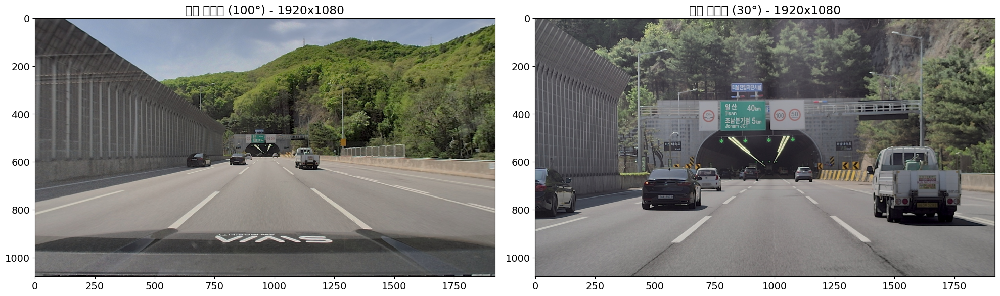

In [43]:
# 실제 카메라 이미지 로드
# 카메라 이미지 경로 설정
data_dir = '/home/byounggun/swm_dataset/swm_dataset/final_folder/final_data'
cam_100_dir = os.path.join(data_dir, 'camera_100')
cam_30_dir = os.path.join(data_dir, 'camera_30')

# 대체 샘플 이미지 경로 (기본 샘플 이미지가 없는 경우)
image_dir = '/home/byounggun/swm_dataset/swm_dataset/final_folder/samples'
sample_wide_path = os.path.join(image_dir, 'cam_100_sample.jpg')
sample_narrow_path = os.path.join(image_dir, 'cam_30_sample.jpg')

# Function to find corresponding images across cameras
def find_image_pairs(cam_100_dir, cam_30_dir, scene_id='scene0041', frame_id=None):
    """Find image pairs that match between wide and narrow cameras"""
    # Get all scene folders in wide camera directory
    try:
        if scene_id is None and os.path.exists(cam_100_dir):
            scene_folders = [d for d in os.listdir(cam_100_dir) if os.path.isdir(os.path.join(cam_100_dir, d))]
            if not scene_folders:
                return None, None
            scene_id = scene_folders[0]  # Take first scene if not specified
        
        wide_scene_dir = os.path.join(cam_100_dir, scene_id)
        narrow_scene_dir = os.path.join(cam_30_dir, scene_id)
        
        if not (os.path.exists(wide_scene_dir) and os.path.exists(narrow_scene_dir)):
            print(f"장면 {scene_id}를 두 카메라 디렉터리에서 찾을 수 없습니다")
            return None, None
        
        # Get all image files in the selected scene
        wide_images = sorted([f for f in os.listdir(wide_scene_dir) 
                            if f.lower().endswith(('.jpg', '.jpeg', '.png'))])
        narrow_images = sorted([f for f in os.listdir(narrow_scene_dir) 
                            if f.lower().endswith(('.jpg', '.jpeg', '.png'))])
        
        if not wide_images or not narrow_images:
            print(f"장면 {scene_id}에서 이미지를 찾을 수 없습니다")
            return None, None
        
        # If frame ID is specified, try to find it
        if frame_id is not None:
            wide_match = [img for img in wide_images if frame_id in img]
            narrow_match = [img for img in narrow_images if frame_id in img]
            
            if wide_match and narrow_match:
                return (os.path.join(wide_scene_dir, wide_match[0]), 
                        os.path.join(narrow_scene_dir, narrow_match[0]))
        
        # Otherwise, take first image from each
        return (os.path.join(wide_scene_dir, wide_images[0]), 
                os.path.join(narrow_scene_dir, narrow_images[0]))
    except Exception as e:
        print(f"이미지 쌍 찾기 오류: {e}")
        return None, None

# 이미지 로드 함수
def load_camera_images():
    """카메라 이미지 로드 함수"""
    # 먼저 실제 데이터셋에서 이미지 쌍 찾기
    wide_img_path, narrow_img_path = find_image_pairs(cam_100_dir, cam_30_dir)
    
    # 이미지 쌍을 찾지 못한 경우 샘플 이미지 사용
    if wide_img_path is None or narrow_img_path is None:
        print("실제 이미지 쌍을 찾을 수 없습니다. 샘플 이미지를 사용합니다.")
        wide_img_path = sample_wide_path
        narrow_img_path = sample_narrow_path
    
    print(f"광각 이미지 경로: {wide_img_path}")
    print(f"협각 이미지 경로: {narrow_img_path}")
    
    # 이미지 파일이 존재하는지 확인
    if not os.path.exists(wide_img_path) or not os.path.exists(narrow_img_path):
        print(f"경고: 이미지 파일을 찾을 수 없습니다.")
        
        # 이미지가 없으면 더미 이미지 생성
        print("이미지 파일이 없어 더미 이미지를 생성합니다.")
        wide_img = np.zeros((1080, 1920, 3), dtype=np.uint8)
        narrow_img = np.zeros((1080, 1920, 3), dtype=np.uint8)
        
        # 구분을 위해 색상 추가
        wide_img[:, :, 0] = 30  # 파란색 계열
        narrow_img[:, :, 2] = 30  # 붉은색 계열
        
        # 테두리 및 격자 패턴 추가
        for i in range(0, wide_img.shape[0], 100):
            cv2.line(wide_img, (0, i), (wide_img.shape[1], i), (255, 255, 255), 1)
        for i in range(0, wide_img.shape[1], 100):
            cv2.line(wide_img, (i, 0), (i, wide_img.shape[0]), (255, 255, 255), 1)
            
        for i in range(0, narrow_img.shape[0], 100):
            cv2.line(narrow_img, (0, i), (narrow_img.shape[1], i), (255, 255, 255), 1)
        for i in range(0, narrow_img.shape[1], 100):
            cv2.line(narrow_img, (i, 0), (i, narrow_img.shape[0]), (255, 255, 255), 1)
        
        # 중앙에 타겟 추가
        cv2.circle(wide_img, (wide_img.shape[1]//2, wide_img.shape[0]//2), 100, (0, 255, 0), 3)
        cv2.circle(narrow_img, (narrow_img.shape[1]//2, narrow_img.shape[0]//2), 100, (0, 255, 0), 3)
        
        # 카메라 타입 텍스트 추가
        cv2.putText(wide_img, "Dummy Wide Camera (100°)", (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
        cv2.putText(narrow_img, "Dummy Narrow Camera (30°)", (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
        
        wide_resized = False
        narrow_resized = False
    else:
        try:
            # 실제 이미지 로드
            print("이미지 파일 로드 중...")
            wide_img = cv2.imread(wide_img_path)
            narrow_img = cv2.imread(narrow_img_path)
            
            # 이미지 로드 확인
            if wide_img is None or narrow_img is None:
                raise ValueError("이미지 로드 실패")
                
            # BGR에서 RGB로 변환 (matplotlib 표시용)
            wide_img = cv2.cvtColor(wide_img, cv2.COLOR_BGR2RGB)
            narrow_img = cv2.cvtColor(narrow_img, cv2.COLOR_BGR2RGB)
            
            # 이미지 크기 확인 및 리사이징 필요 여부 체크
            wide_resized = wide_img.shape[:2] != (1080, 1920)  # (height, width)
            narrow_resized = narrow_img.shape[:2] != (1080, 1920)
            
            # 리사이징이 필요한 경우 경고
            if wide_resized or narrow_resized:
                print("경고: 이미지 크기가 예상과 다릅니다. 카메라 파라미터와 일치하도록 조정이 필요할 수 있습니다.")
                print(f"광각 이미지 크기: {wide_img.shape}")
                print(f"협각 이미지 크기: {narrow_img.shape}")
                
                # 필요에 따라 이미지 리사이징
                # if wide_resized:
                #     target_height = 1080
                #     target_width = 1920
                #     wide_img = cv2.resize(wide_img, (target_width, target_height))
                # if narrow_resized:
                #     target_height = 1080
                #     target_width = 1920
                #     narrow_img = cv2.resize(narrow_img, (target_width, target_height))
        except Exception as e:
            print(f"이미지 로드 오류: {e}")
            # 오류 발생 시 더미 이미지 사용
            wide_img = np.zeros((1080, 1920, 3), dtype=np.uint8)
            narrow_img = np.zeros((1080, 1920, 3), dtype=np.uint8)
            wide_img[:, :, 0] = 30  # 파란색 계열
            narrow_img[:, :, 2] = 30  # 붉은색 계열
            cv2.putText(wide_img, f"Error: {str(e)}", (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
            cv2.putText(narrow_img, f"Error: {str(e)}", (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
            wide_resized = False
            narrow_resized = False
    
    print(f"이미지 로드 완료 - 광각: {wide_img.shape}, 협각: {narrow_img.shape}")
    return wide_img, narrow_img, wide_resized, narrow_resized

# 이미지 로드
wide_img, narrow_img, wide_resized, narrow_resized = load_camera_images()

# 로드된 이미지 표시
plt.figure(figsize=(20, 8))

plt.subplot(1, 2, 1)
plt.imshow(wide_img)
plt.title(f"광각 카메라 (100°) - {wide_img.shape[1]}x{wide_img.shape[0]}")
plt.axis('on')

plt.subplot(1, 2, 2)
plt.imshow(narrow_img)
plt.title(f"협각 카메라 (30°) - {narrow_img.shape[1]}x{narrow_img.shape[0]}")
plt.axis('on')

plt.tight_layout()
plt.show()

In [44]:
# 원본 이미지 크기와 로드된 카메라 파라미터 크기가 일치하는지 확인
print("\n카메라 파라미터 크기 확인:")
# YAML 파일 구조에 맞게 접근 방식 수정
wide_width_param = cam_100_intrinsics.get('width', 1920)
wide_height_param = cam_100_intrinsics.get('height', 1080)
narrow_width_param = cam_30_intrinsics.get('width', 1920)
narrow_height_param = cam_30_intrinsics.get('height', 1080)

print(f"광각(cam_100) 파라미터: {wide_width_param} x {wide_height_param}")
print(f"협각(cam_30) 파라미터: {narrow_width_param} x {narrow_height_param}")

# 이미지 크기와 파라미터 크기 비교
wide_img_shape = wide_img.shape
narrow_img_shape = narrow_img.shape

print(f"광각(cam_100) 이미지: {wide_img_shape[1]} x {wide_img_shape[0]}")
print(f"협각(cam_30) 이미지: {narrow_img_shape[1]} x {narrow_img_shape[0]}")

# 이미지와 파라미터 크기 불일치 확인
wide_resized = (wide_img_shape[1] != wide_width_param) or (wide_img_shape[0] != wide_height_param)
narrow_resized = (narrow_img_shape[1] != narrow_width_param) or (narrow_img_shape[0] != narrow_height_param)

# 문제가 발생한 경우 조정이 필요
if wide_resized or narrow_resized:
    print("\n문제: 이미지 로드 크기가 카메라 파라미터의 예상 크기와 다릅니다.")
    print("해결책: 적절한 스케일 조정이 필요합니다.")
    
    # 이미지 크기와 파라미터 간 비율 계산
    if wide_resized:
        wide_scale_x = wide_img.shape[1] / wide_width_param
        wide_scale_y = wide_img.shape[0] / wide_height_param
        print(f"광각 이미지 스케일 비율: x={wide_scale_x:.4f}, y={wide_scale_y:.4f}")
        
    if narrow_resized:
        narrow_scale_x = narrow_img.shape[1] / narrow_width_param
        narrow_scale_y = narrow_img.shape[0] / narrow_height_param
        print(f"협각 이미지 스케일 비율: x={narrow_scale_x:.4f}, y={narrow_scale_y:.4f}")

# 카메라 내부 파라미터 가져오기 (K 행렬에서 값 추출)
# K 행렬 형식: [fx, s, cx, 0, fy, cy, 0, 0, 1]
try:
    # K 행렬에서 파라미터 추출
    wide_K = cam_100_intrinsics.get('K', [1178.6, 0, 960, 0, 1178.6, 540, 0, 0, 1])
    narrow_K = cam_30_intrinsics.get('K', [4125.6, 0, 960, 0, 4125.6, 540, 0, 0, 1])
    
    wide_fx = float(wide_K[0])   # K[0]
    wide_fy = float(wide_K[4])   # K[4]
    wide_cx = float(wide_K[2])   # K[2]
    wide_cy = float(wide_K[5])   # K[5]
    
    narrow_fx = float(narrow_K[0])  # K[0]
    narrow_fy = float(narrow_K[4])  # K[4] 
    narrow_cx = float(narrow_K[2])  # K[2]
    narrow_cy = float(narrow_K[5])  # K[5]
    
    print("\n카메라 내부 파라미터:")
    print(f"광각(cam_100): fx={wide_fx:.1f}, fy={wide_fy:.1f}, cx={wide_cx:.1f}, cy={wide_cy:.1f}")
    print(f"협각(cam_30): fx={narrow_fx:.1f}, fy={narrow_fy:.1f}, cx={narrow_cx:.1f}, cy={narrow_cy:.1f}")
    print(f"초점거리 비율: fx={narrow_fx/wide_fx:.2f}x, fy={narrow_fy/wide_fy:.2f}x")
    
except Exception as e:
    print(f"\n카메라 파라미터 추출 오류: {e}")
    # 기본값 사용
    wide_fx, wide_fy = 1178.6, 1200.9
    wide_cx, wide_cy = 936.4, 545.8
    narrow_fx, narrow_fy = 4125.6, 4123.2  
    narrow_cx, narrow_cy = 929.4, 592.4

# 이미지와 파라미터 크기 스케일 조정 (필요한 경우)
if wide_resized:
    wide_scale_x = wide_img.shape[1] / wide_width_param
    wide_scale_y = wide_img.shape[0] / wide_height_param
    wide_fx *= wide_scale_x
    wide_fy *= wide_scale_y
    wide_cx *= wide_scale_x
    wide_cy *= wide_scale_y
    print(f"\n광각 카메라 파라미터 스케일 조정 후:")
    print(f"fx={wide_fx:.1f}, fy={wide_fy:.1f}, cx={wide_cx:.1f}, cy={wide_cy:.1f}")

if narrow_resized:
    narrow_scale_x = narrow_img.shape[1] / narrow_width_param
    narrow_scale_y = narrow_img.shape[0] / narrow_height_param
    narrow_fx *= narrow_scale_x
    narrow_fy *= narrow_scale_y
    narrow_cx *= narrow_scale_x
    narrow_cy *= narrow_scale_y
    print(f"\n협각 카메라 파라미터 스케일 조정 후:")
    print(f"fx={narrow_fx:.1f}, fy={narrow_fy:.1f}, cx={narrow_cx:.1f}, cy={narrow_cy:.1f}")

# FOV 계산 방법 검증
print("\nFOV 계산 검증:")

# 현재 이미지 크기 기준
wide_width = wide_img.shape[1]
wide_height = wide_img.shape[0]
narrow_width = narrow_img.shape[1]
narrow_height = narrow_img.shape[0]

# FOV 계산: 2 * arctan(sensor_size / (2 * focal_length))
wide_hfov_alt = 2 * np.arctan(wide_width / (2 * wide_fx))
wide_vfov_alt = 2 * np.arctan(wide_height / (2 * wide_fy))
narrow_hfov_alt = 2 * np.arctan(narrow_width / (2 * narrow_fx))
narrow_vfov_alt = 2 * np.arctan(narrow_height / (2 * narrow_fy))

wide_hfov_deg = np.degrees(wide_hfov_alt)
wide_vfov_deg = np.degrees(wide_vfov_alt)
narrow_hfov_deg = np.degrees(narrow_hfov_alt)
narrow_vfov_deg = np.degrees(narrow_vfov_alt)

print(f"- 광각 horizontal FOV: {wide_hfov_deg:.2f}°")
print(f"- 협각 horizontal FOV: {narrow_hfov_deg:.2f}°")
print(f"- 광각 vertical FOV: {wide_vfov_deg:.2f}°")
print(f"- 협각 vertical FOV: {narrow_vfov_deg:.2f}°")

# FOV 비율 계산
fov_ratio_h = wide_hfov_alt / narrow_hfov_alt
fov_ratio_v = wide_vfov_alt / narrow_vfov_alt

print(f"\nFOV 비율: 수평={fov_ratio_h:.4f}x, 수직={fov_ratio_v:.4f}x")

# 새로운 박스 계산
# 대체 계산법으로 박스 크기 계산
narrow_in_wide_width_alt = wide_width / fov_ratio_h
narrow_in_wide_height_alt = wide_height / fov_ratio_v

# 박스 위치 계산 (이미지 중앙)
center_x = wide_width / 2
center_y = wide_height / 2

# 박스 좌표 계산
x1_alt = int(center_x - narrow_in_wide_width_alt / 2)
y1_alt = int(center_y - narrow_in_wide_height_alt / 2)
x2_alt = int(center_x + narrow_in_wide_width_alt / 2)
y2_alt = int(center_y + narrow_in_wide_height_alt / 2)

# YOLO 포맷 박스 좌표 계산
bbox_x_center_alt = center_x / wide_width
bbox_y_center_alt = center_y / wide_height
bbox_width_alt = narrow_in_wide_width_alt / wide_width
bbox_height_alt = narrow_in_wide_height_alt / wide_height

print("\n== 내부 파라미터 기반 계산 결과 ==")
print(f"박스 크기 (픽셀): {x2_alt-x1_alt}x{y2_alt-y1_alt}")
print(f"YOLO 포맷: center=({bbox_x_center_alt:.4f}, {bbox_y_center_alt:.4f}), size=({bbox_width_alt:.4f}, {bbox_height_alt:.4f})")


카메라 파라미터 크기 확인:
광각(cam_100) 파라미터: 1920 x 1080
협각(cam_30) 파라미터: 1920 x 1080
광각(cam_100) 이미지: 1920 x 1080
협각(cam_30) 이미지: 1920 x 1080

카메라 내부 파라미터:
광각(cam_100): fx=1178.7, fy=1200.9, cx=936.4, cy=545.8
협각(cam_30): fx=4125.6, fy=4123.2, cx=929.4, cy=592.4
초점거리 비율: fx=3.50x, fy=3.43x

FOV 계산 검증:
- 광각 horizontal FOV: 78.32°
- 협각 horizontal FOV: 26.20°
- 광각 vertical FOV: 48.42°
- 협각 vertical FOV: 14.92°

FOV 비율: 수평=2.9897x, 수직=3.2450x

== 내부 파라미터 기반 계산 결과 ==
박스 크기 (픽셀): 643x333
YOLO 포맷: center=(0.5000, 0.5000), size=(0.3345, 0.3082)


In [45]:
# extrinsic 파라미터 로드
# 두 카메라의 외부 파라미터 파일을 로드하여 상대적 위치와 회전 정보를 계산합니다

# 외부 파라미터 YAML 파일 경로
cam_100_extrinsics_path = os.path.join(calibration_dir, 'cam_100_extrinsics.yaml')
cam_30_extrinsics_path = os.path.join(calibration_dir, 'cam_30_extrinsics.yaml')

def load_extrinsic_params(file_path):
    """외부 파라미터 파일 로드"""
    if not os.path.exists(file_path):
        print(f"경고: 외부 파라미터 파일을 찾을 수 없습니다: {file_path}")
        # 파일이 없으면 기본값 반환 (단위 행렬 회전, 영벡터 평행이동)
        return None
    
    try:
        with open(file_path, 'r') as f:
            data = yaml.safe_load(f)
        return data
    except Exception as e:
        print(f"외부 파라미터 파일 로드 오류 ({file_path}): {e}")
        return None

# 두 카메라의 외부 파라미터 로드
cam_100_extrinsics = load_extrinsic_params(cam_100_extrinsics_path)
cam_30_extrinsics = load_extrinsic_params(cam_30_extrinsics_path)

print("=" * 50)
print("외부 파라미터 정보")
print("=" * 50)

# 각 카메라의 외부 파라미터 확인
if cam_100_extrinsics and cam_30_extrinsics:
    # 두 카메라의 변환 정보 추출
    try:
        # 쿼터니언에서 회전 행렬 변환 함수
        def quaternion_to_rotation_matrix(q):
            """쿼터니언을 회전 행렬로 변환"""
            x, y, z, w = q
            
            # 회전 행렬 요소 계산
            R = np.zeros((3, 3))
            
            R[0, 0] = 1 - 2*y*y - 2*z*z
            R[0, 1] = 2*x*y - 2*z*w
            R[0, 2] = 2*x*z + 2*y*w
            
            R[1, 0] = 2*x*y + 2*z*w
            R[1, 1] = 1 - 2*x*x - 2*z*z
            R[1, 2] = 2*y*z - 2*x*w
            
            R[2, 0] = 2*x*z - 2*y*w
            R[2, 1] = 2*y*z + 2*x*w
            R[2, 2] = 1 - 2*x*x - 2*y*y
            
            return R
        
        # cam_100의 변환 정보
        cam_100_trans = cam_100_extrinsics['transform']['translation']
        cam_100_rot_q = cam_100_extrinsics['transform']['rotation']  # 쿼터니언
        
        # cam_30의 변환 정보
        cam_30_trans = cam_30_extrinsics['transform']['translation']
        cam_30_rot_q = cam_30_extrinsics['transform']['rotation']  # 쿼터니언
        
        # 쿼터니언을 회전 행렬로 변환
        cam_100_rot_q_array = [cam_100_rot_q['x'], cam_100_rot_q['y'], cam_100_rot_q['z'], cam_100_rot_q['w']]
        cam_30_rot_q_array = [cam_30_rot_q['x'], cam_30_rot_q['y'], cam_30_rot_q['z'], cam_30_rot_q['w']]
        
        cam_100_R = quaternion_to_rotation_matrix(cam_100_rot_q_array)
        cam_30_R = quaternion_to_rotation_matrix(cam_30_rot_q_array)
        
        # 평행이동 벡터
        cam_100_T = np.array([cam_100_trans['x'], cam_100_trans['y'], cam_100_trans['z']])
        cam_30_T = np.array([cam_30_trans['x'], cam_30_trans['y'], cam_30_trans['z']])
        
        print("\n광각 카메라(cam_100) 외부 파라미터:")
        print(f"- 평행이동 (x, y, z): {cam_100_T}")
        print("- 회전 행렬:")
        print(cam_100_R)
        
        print("\n협각 카메라(cam_30) 외부 파라미터:")
        print(f"- 평행이동 (x, y, z): {cam_30_T}")
        print("- 회전 행렬:")
        print(cam_30_R)
        
        # cam_30에서 cam_100으로의 상대적 변환 계산
        # cam_100^-1 * cam_30
        R_100_inv = cam_100_R.T  # 회전 행렬의 역행렬은 전치 행렬
        T_100_inv = -np.dot(R_100_inv, cam_100_T)
        
        # 30에서 100으로의 상대적 회전
        R_30_to_100 = np.dot(R_100_inv, cam_30_R)
        
        # 30에서 100으로의 상대적 평행이동
        T_30_to_100 = T_100_inv + np.dot(R_100_inv, cam_30_T)
        
        print("\ncam_30에서 cam_100으로의 상대적 변환:")
        print("- 상대적 회전 행렬:")
        print(R_30_to_100)
        print(f"- 상대적 평행이동 (x, y, z): {T_30_to_100}")
        
        # 최종 외부 파라미터 설정
        R = R_30_to_100
        T = T_30_to_100
        
    except Exception as e:
        print(f"외부 파라미터 변환 오류: {e}")
        print("기본값 사용")
        R = np.eye(3)  # 단위 행렬
        T = np.zeros(3)  # 영벡터
else:
    print("하나 이상의 외부 파라미터 파일을 로드하지 못했습니다.")
    print("기본값을 사용합니다 (회전 없음, 평행이동 없음)")
    R = np.eye(3)  # 기본값: 단위 행렬 (회전 없음)
    T = np.zeros(3)  # 기본값: 영벡터 (평행이동 없음)

외부 파라미터 정보

광각 카메라(cam_100) 외부 파라미터:
- 평행이동 (x, y, z): [ 0.5055 -0.0025 -0.2134]
- 회전 행렬:
[[ 0.014123    0.12060006  0.99263558]
 [-0.99988014  0.01206006  0.01279194]
 [-0.01046302 -0.99266286  0.1207175 ]]

협각 카메라(cam_30) 외부 파라미터:
- 평행이동 (x, y, z): [ 0.5059 -0.0325 -0.2137]
- 회전 행렬:
[[ 0.0036199   0.11300118  0.99363156]
 [-0.99996906  0.01190774  0.00232732]
 [-0.01161132 -0.99356644  0.1129934 ]]

cam_30에서 cam_100으로의 상대적 변환:
- 상대적 회전 행렬:
[[ 1.00002182e+00  8.53084599e-05  1.05237653e-02]
 [-9.70005850e-05  1.00004806e+00  7.69574177e-03]
 [-1.05999922e-02 -7.61954178e-03  9.99984092e-01]]
- 상대적 평행이동 (x, y, z): [ 3.00051923e-02 -1.57629180e-05 -2.29192180e-05]


In [46]:
# Extrinsic 파라미터를 활용한 FOV 계산
# 두 카메라 간의 상대적 위치와 방향을 고려하여 FOV를 계산합니다

# 3D 공간상의 점들을 2D 이미지 좌표로 투영하는 함수
def project_3d_to_2d(points_3d, K, R, T):
    """
    3D 공간상의 점들을 2D 이미지 좌표로 투영
    
    Args:
        points_3d: [N, 3] 형태의 3D 점 배열
        K: 3x3 카메라 내부 파라미터 행렬
        R: 3x3 회전 행렬
        T: 3x1 평행이동 벡터
        
    Returns:
        [N, 2] 형태의 투영된 2D 점 배열
    """
    # 회전과 평행이동 적용 ([R|T] * [X,Y,Z,1]^T)
    RT = np.hstack((R, T.reshape(3, 1)))
    
    # 3D 점들에 호모지니어스 좌표 추가 (마지막에 1 추가)
    if len(points_3d.shape) == 1:  # 단일 점인 경우
        points_3d = points_3d.reshape(1, 3)
    
    points_homogeneous = np.hstack((points_3d, np.ones((points_3d.shape[0], 1))))
    
    # 카메라 좌표계로 변환
    points_cam = np.dot(RT, points_homogeneous.T).T
    
    # Z 좌표가 0이하인 점들(카메라 뒤에 있는 점들)은 제외
    valid_points = points_cam[:, 2] > 0
    
    # 유효한 점이 없으면 빈 배열 반환
    if not np.any(valid_points):
        return np.array([])
    
    # 유효한 점들만 선택
    valid_cam_points = points_cam[valid_points]
    
    # 정규화된 이미지 좌표로 변환 (z로 나누기)
    points_normalized = valid_cam_points[:, :2] / valid_cam_points[:, 2:3]
    
    # 이미지 좌표로 변환
    K_reduced = K[:2, :2]  # 2x2 부분 행렬
    c = K[:2, 2]  # 주점 좌표 (cx, cy)
    
    points_2d = np.dot(points_normalized, K_reduced.T) + c
    
    return points_2d

# 협각 카메라의 FOV 코너 점들 계산
def calculate_fov_corners(width, height, K):
    """이미지 코너에 해당하는 시야각 방향 벡터 계산"""
    # 이미지 코너 좌표 (픽셀 좌표계)
    corners_pixel = np.array([
        [0, 0],              # 좌상단
        [width, 0],          # 우상단
        [width, height],     # 우하단
        [0, height]          # 좌하단
    ], dtype=np.float32)
    
    # 내부 파라미터 행렬에서 주요 값 추출
    fx = K[0, 0]
    fy = K[1, 1]
    cx = K[0, 2]
    cy = K[1, 2]
    
    # 픽셀 좌표를 정규화된 카메라 좌표로 변환
    corners_normalized = np.zeros_like(corners_pixel)
    corners_normalized[:, 0] = (corners_pixel[:, 0] - cx) / fx
    corners_normalized[:, 1] = (corners_pixel[:, 1] - cy) / fy
    
    # 3D 방향 벡터로 확장 (z=1로 설정)
    corners_3d = np.hstack((corners_normalized, np.ones((4, 1))))
    
    return corners_3d

# 내부 파라미터 행렬 구성
narrow_K_matrix = np.array([
    [narrow_fx, 0, narrow_cx],
    [0, narrow_fy, narrow_cy],
    [0, 0, 1]
])

wide_K_matrix = np.array([
    [wide_fx, 0, wide_cx],
    [0, wide_fy, wide_cy],
    [0, 0, 1]
])

# 협각 카메라의 FOV 코너 계산 - 방향 벡터 형태로
narrow_corners_3d = calculate_fov_corners(narrow_width, narrow_height, narrow_K_matrix)

# FOV 광선 계산을 위한 함수 정의
def calculate_fov_rays(corners_3d, resolution=20):
    """
    FOV 광선 벡터 계산 - 이미지 가장자리를 따라 광선 생성
    
    Args:
        corners_3d: 4개의 이미지 모서리에 대한 광선 벡터
        resolution: 각 변마다 생성할 점의 개수
    
    Returns:
        광선을 나타내는 3D 단위 벡터들의 배열
    """
    rays = []
    
    # 이미지 가장자리를 따라 점 샘플링
    # 좌상단 -> 우상단
    for i in range(resolution):
        t = i / (resolution - 1)
        ray = (1-t) * corners_3d[0, :3] + t * corners_3d[1, :3]
        rays.append(ray / np.linalg.norm(ray))  # 단위 벡터로 정규화
    
    # 우상단 -> 우하단
    for i in range(resolution):
        t = i / (resolution - 1)
        ray = (1-t) * corners_3d[1, :3] + t * corners_3d[2, :3]
        rays.append(ray / np.linalg.norm(ray))
    
    # 우하단 -> 좌하단
    for i in range(resolution):
        t = i / (resolution - 1)
        ray = (1-t) * corners_3d[2, :3] + t * corners_3d[3, :3]
        rays.append(ray / np.linalg.norm(ray))
    
    # 좌하단 -> 좌상단
    for i in range(resolution):
        t = i / (resolution - 1)
        ray = (1-t) * corners_3d[3, :3] + t * corners_3d[0, :3]
        rays.append(ray / np.linalg.norm(ray))
    
    return np.array(rays)

# FOV 광선 계산 - 이미지 가장자리 및 내부 광선 포함
def calculate_complete_fov(corners_3d, edge_resolution=20, grid_resolution=10):
    """
    FOV 광선 벡터 계산 - 이미지 가장자리와 내부 그리드 포인트 포함
    
    Args:
        corners_3d: 4개의 이미지 모서리에 대한 광선 벡터
        edge_resolution: 각 가장자리마다 생성할 점의 개수
        grid_resolution: 이미지 내부 그리드의 해상도
    
    Returns:
        광선을 나타내는 3D 단위 벡터들의 배열
    """
    rays = []
    
    # 1. 이미지 가장자리 광선
    edge_rays = calculate_fov_rays(corners_3d, edge_resolution)
    rays.extend(edge_rays)
    
    # 2. 이미지 내부 그리드 광선
    for i in range(1, grid_resolution-1):
        for j in range(1, grid_resolution-1):
            # 이미지 내부의 그리드 점들에 대한 보간 계수
            u = i / (grid_resolution - 1)
            v = j / (grid_resolution - 1)
            
            # 윗변과 아랫변 사이의 점 보간
            top_point = (1-u) * corners_3d[0, :3] + u * corners_3d[1, :3]
            bottom_point = (1-u) * corners_3d[3, :3] + u * corners_3d[2, :3]
            
            # 최종 그리드 포인트 (top_point와 bottom_point 사이 보간)
            grid_point = (1-v) * top_point + v * bottom_point
            
            # 단위 벡터로 정규화
            ray = grid_point / np.linalg.norm(grid_point)
            rays.append(ray)
    
    return np.array(rays)

# 협각 카메라의 FOV 광선 계산
fov_rays = calculate_complete_fov(narrow_corners_3d, edge_resolution=50, grid_resolution=15)
print(f"생성된 FOV 광선 벡터 개수: {fov_rays.shape[0]}")

# 광선-평면 교차점 계산 함수
def ray_plane_intersection(ray_origins, ray_directions, plane_normal, plane_point):
    """
    광선과 평면의 교차점 계산
    
    Args:
        ray_origins: 광선 시작점 배열 [N, 3]
        ray_directions: 광선 방향 벡터 배열 [N, 3] (정규화 필요)
        plane_normal: 평면의 법선 벡터 [3]
        plane_point: 평면 위의 점 [3]
    
    Returns:
        교차점 배열 [N, 3]
    """
    # 광선과 평면의 상대 방향성 계산
    dots = np.dot(ray_directions, plane_normal)
    
    # 평면과 평행하거나 뒤쪽을 향한 광선 제외
    valid = dots > 1e-6
    
    # 유효한 광선이 없으면 빈 배열 반환
    if not np.any(valid):
        return np.array([])
    
    # 교차점까지의 거리 계산
    d = np.dot((plane_point - ray_origins[valid]), plane_normal) / dots[valid]
    
    # 음수 거리(카메라 뒤에 있는 교차점) 제외
    positive_d = d > 0
    
    if not np.any(positive_d):
        return np.array([])
    
    # 최종 유효한 거리
    d_final = d[positive_d]
    
    # 유효한 광선 방향
    valid_dirs = ray_directions[valid][positive_d]
    
    # 유효한 광선 원점
    valid_origins = ray_origins[valid][positive_d]
    
    # 교차점 계산
    intersections = valid_origins + d_final[:, np.newaxis] * valid_dirs
    
    return intersections

# 카메라 위치와 광선 방향 설정
# (협각 카메라는 원점에 있다고 가정, 광각 카메라는 외부 파라미터에 의해 상대적 위치 결정)
cam_narrow_pos = np.zeros(3)
cam_wide_pos = -T  # T는 협각에서 광각으로의 변환이므로, 광각의 위치는 -T

# 가상의 평면 설정 (본질적으로 무한 거리 투영과 동일하게 동작)
# 협각 카메라 앞 방향(Z축)으로 평면 정의, 충분히 먼 거리(예: 100단위)에 위치
plane_normal = np.array([0, 0, 1])  # 협각 카메라 Z축 방향
plane_point = np.array([0, 0, 100])  # 협각 카메라에서 100단위 거리에 있는 평면

# 협각 카메라에서 본 광선들
narrow_rays_origins = np.tile(cam_narrow_pos, (fov_rays.shape[0], 1))
narrow_rays_directions = fov_rays

# 광선-평면 교차점 계산
intersections = ray_plane_intersection(narrow_rays_origins, narrow_rays_directions, plane_normal, plane_point)

# 교차점들을 광각 카메라 좌표계로 변환
# 회전 적용
rotated_intersections = np.dot(R, intersections.T).T
# 평행이동 적용
transformed_intersections = rotated_intersections + T

# 변환된 교차점들을 광각 카메라 이미지 평면에 투영
# 광각 카메라의 투영 행렬 사용
projected_corners = project_3d_to_2d(transformed_intersections, wide_K_matrix, np.eye(3), np.zeros(3))

if len(projected_corners) > 0:
    # 투영된 점들의 경계 상자 계산
    min_x = max(0, np.min(projected_corners[:, 0]))
    max_x = min(wide_width, np.max(projected_corners[:, 0]))
    min_y = max(0, np.min(projected_corners[:, 1]))
    max_y = min(wide_height, np.max(projected_corners[:, 1]))

    # 투영된 점들의 통계 정보
    print(f"\n투영된 점 개수: {projected_corners.shape[0]}")
    print(f"투영 범위 X: {min_x:.1f} - {max_x:.1f}, Y: {min_y:.1f} - {max_y:.1f}")

    # YOLO 형식의 바운딩 박스 계산
    extrinsic_bbox_x_center = (min_x + max_x) / 2 / wide_width
    extrinsic_bbox_y_center = (min_y + max_y) / 2 / wide_height
    extrinsic_bbox_width = (max_x - min_x) / wide_width
    extrinsic_bbox_height = (max_y - min_y) / wide_height
    
    print("=" * 50)
    print("Extrinsic 파라미터를 활용한 FOV 계산 결과")
    print("=" * 50)
    print(f"협각 카메라 FOV의 광각 이미지 투영 좌표:")
    print(f"좌상단: ({min_x:.1f}, {min_y:.1f})")
    print(f"우하단: ({max_x:.1f}, {max_y:.1f})")
    print(f"박스 크기: {max_x-min_x:.1f}x{max_y-min_y:.1f} 픽셀")
    print(f"\nYOLO 형식 바운딩 박스:")
    print(f"중심: ({extrinsic_bbox_x_center:.6f}, {extrinsic_bbox_y_center:.6f})")
    print(f"크기: {extrinsic_bbox_width:.6f}x{extrinsic_bbox_height:.6f}")
    print(f"\nYOLO 학습용 형식: 0 {extrinsic_bbox_x_center:.6f} {extrinsic_bbox_y_center:.6f} {extrinsic_bbox_width:.6f} {extrinsic_bbox_height:.6f}")

    # 이전 결과와 비교
    print("\n이전 계산 방식과 비교:")
    print(f"내부 파라미터만 사용: {bbox_width_alt:.6f}x{bbox_height_alt:.6f}")
    print(f"외부+내부 파라미터 사용: {extrinsic_bbox_width:.6f}x{extrinsic_bbox_height:.6f}")
    print(f"차이(크기): {abs(extrinsic_bbox_width - bbox_width_alt):.6f}x{abs(extrinsic_bbox_height - bbox_height_alt):.6f}")
    print(f"차이(중심): {abs(extrinsic_bbox_x_center - bbox_x_center_alt):.6f}x{abs(extrinsic_bbox_y_center - bbox_y_center_alt):.6f}")
else:
    print("=" * 50)
    print("Extrinsic 파라미터를 활용한 FOV 계산 결과")
    print("=" * 50)
    print("투영된 점이 없습니다. 외부 파라미터 값을 확인해주세요.")
    # 이전 결과를 그대로 사용
    extrinsic_bbox_x_center = bbox_x_center_alt
    extrinsic_bbox_y_center = bbox_y_center_alt
    extrinsic_bbox_width = bbox_width_alt
    extrinsic_bbox_height = bbox_height_alt

생성된 FOV 광선 벡터 개수: 369

투영된 점 개수: 369
투영 범위 X: 684.0 - 1233.2, Y: 382.2 - 697.6
Extrinsic 파라미터를 활용한 FOV 계산 결과
협각 카메라 FOV의 광각 이미지 투영 좌표:
좌상단: (684.0, 382.2)
우하단: (1233.2, 697.6)
박스 크기: 549.2x315.3 픽셀

YOLO 형식 바운딩 박스:
중심: (0.499289, 0.499912)
크기: 0.286041x0.291975

YOLO 학습용 형식: 0 0.499289 0.499912 0.286041 0.291975

이전 계산 방식과 비교:
내부 파라미터만 사용: 0.334485x0.308170
외부+내부 파라미터 사용: 0.286041x0.291975
차이(크기): 0.048444x0.016194
차이(중심): 0.000711x0.000088


시각화 및 결과 비교


/tmp/ipykernel_434795/3664827716.py:59: UserWarning: Glyph 45236 (\N{HANGUL SYLLABLE NAE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:59: UserWarning: Glyph 48512 (\N{HANGUL SYLLABLE BU}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:59: UserWarning: Glyph 54028 (\N{HANGUL SYLLABLE PA}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:59: UserWarning: Glyph 46972 (\N{HANGUL SYLLABLE RA}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:59: UserWarning: Glyph 48120 (\N{HANGUL SYLLABLE MI}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:59: UserWarning: Glyph 53552 (\N{HANGUL SYLLABLE TEO}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:59: UserWarning: Glyph 47564 (\N{HANGUL SYLLABLE MAN}) missing from font(s) DejaVu Sans.
  p

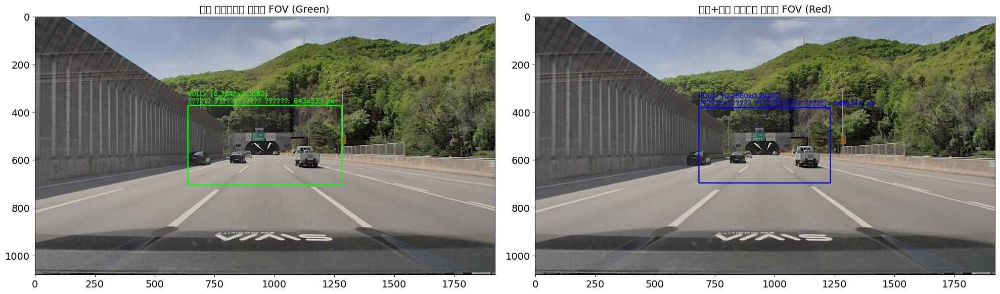

/tmp/ipykernel_434795/3664827716.py:97: UserWarning: Glyph 48708 (\N{HANGUL SYLLABLE BI}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:97: UserWarning: Glyph 44368 (\N{HANGUL SYLLABLE GYO}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:97: UserWarning: Glyph 45236 (\N{HANGUL SYLLABLE NAE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:97: UserWarning: Glyph 48512 (\N{HANGUL SYLLABLE BU}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:97: UserWarning: Glyph 54028 (\N{HANGUL SYLLABLE PA}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:97: UserWarning: Glyph 46972 (\N{HANGUL SYLLABLE RA}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:97: UserWarning: Glyph 48120 (\N{HANGUL SYLLABLE MI}) missing from font(s) DejaVu Sans.
  pl

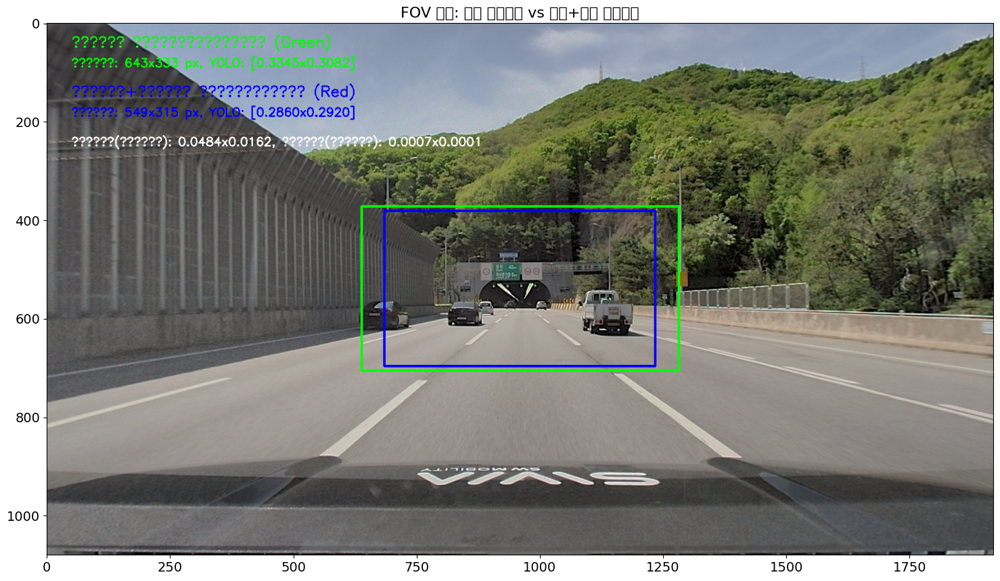

/tmp/ipykernel_434795/3664827716.py:186: UserWarning: Glyph 46160 (\N{HANGUL SYLLABLE DU}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:186: UserWarning: Glyph 52852 (\N{HANGUL SYLLABLE KA}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:186: UserWarning: Glyph 47700 (\N{HANGUL SYLLABLE ME}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:186: UserWarning: Glyph 46972 (\N{HANGUL SYLLABLE RA}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:186: UserWarning: Glyph 51032 (\N{HANGUL SYLLABLE YI}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:186: UserWarning: Glyph 44277 (\N{HANGUL SYLLABLE GONG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:186: UserWarning: Glyph 44036 (\N{HANGUL SYLLABLE GAN}) missing from font(s) DejaVu Sa

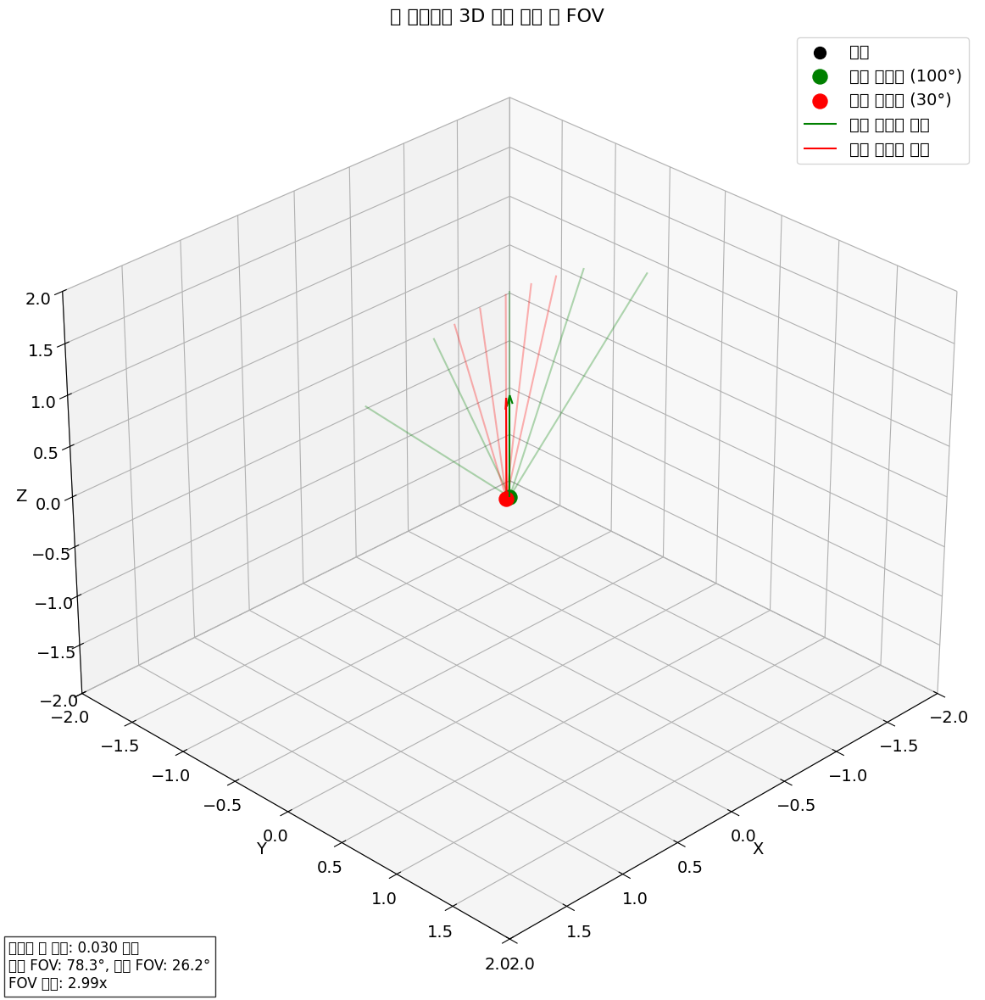

협각 카메라 FOV 시각화 및 이미지 비교


/tmp/ipykernel_434795/3664827716.py:254: UserWarning: Glyph 44305 (\N{HANGUL SYLLABLE GWANG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:254: UserWarning: Glyph 44033 (\N{HANGUL SYLLABLE GAG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:254: UserWarning: Glyph 52852 (\N{HANGUL SYLLABLE KA}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:254: UserWarning: Glyph 47700 (\N{HANGUL SYLLABLE ME}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:254: UserWarning: Glyph 46972 (\N{HANGUL SYLLABLE RA}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:254: UserWarning: Glyph 54801 (\N{HANGUL SYLLABLE HYEOB}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:254: UserWarning: Glyph 50808 (\N{HANGUL SYLLABLE OE}) missing from font(s) DejaV

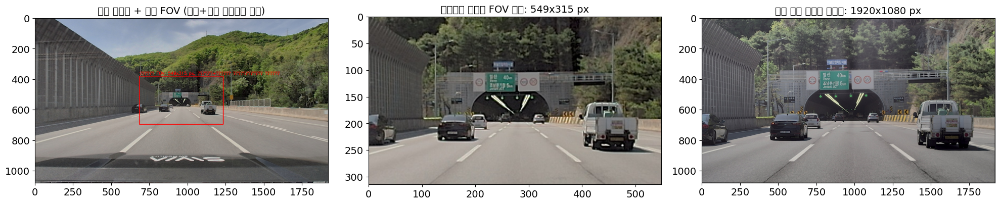

/tmp/ipykernel_434795/3664827716.py:285: UserWarning: Glyph 44305 (\N{HANGUL SYLLABLE GWANG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:285: UserWarning: Glyph 44033 (\N{HANGUL SYLLABLE GAG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:285: UserWarning: Glyph 52852 (\N{HANGUL SYLLABLE KA}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:285: UserWarning: Glyph 47700 (\N{HANGUL SYLLABLE ME}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:285: UserWarning: Glyph 46972 (\N{HANGUL SYLLABLE RA}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:285: UserWarning: Glyph 50640 (\N{HANGUL SYLLABLE E}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:285: UserWarning: Glyph 49436 (\N{HANGUL SYLLABLE SEO}) missing from font(s) DejaVu S

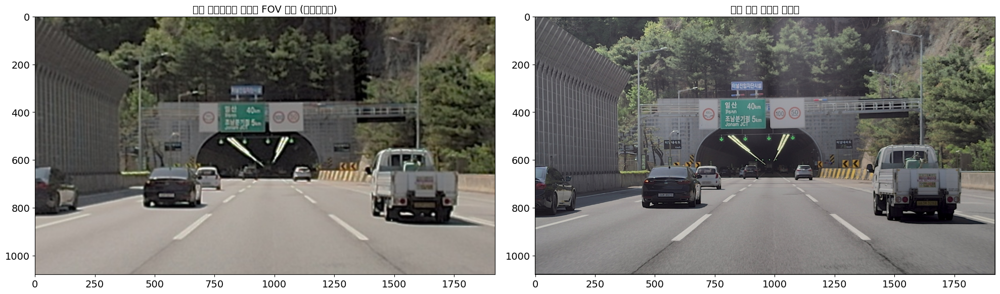

/tmp/ipykernel_434795/3664827716.py:327: UserWarning: Glyph 54801 (\N{HANGUL SYLLABLE HYEOB}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:327: UserWarning: Glyph 44033 (\N{HANGUL SYLLABLE GAG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:327: UserWarning: Glyph 51060 (\N{HANGUL SYLLABLE I}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:327: UserWarning: Glyph 48120 (\N{HANGUL SYLLABLE MI}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:327: UserWarning: Glyph 51648 (\N{HANGUL SYLLABLE JI}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:327: UserWarning: Glyph 50689 (\N{HANGUL SYLLABLE YEONG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:327: UserWarning: Glyph 50669 (\N{HANGUL SYLLABLE YEOG}) missing from font(s) Deja

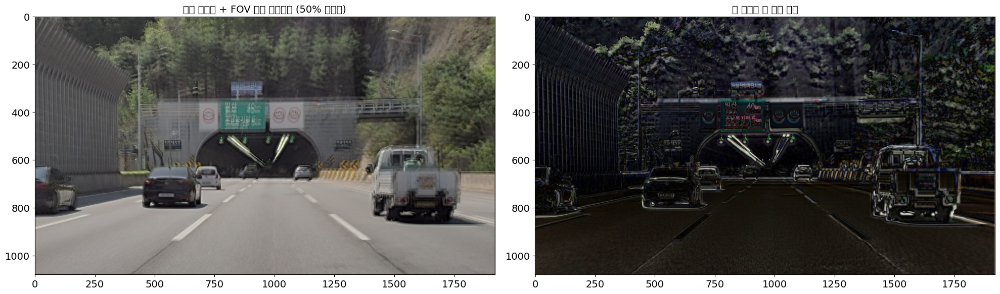

/tmp/ipykernel_434795/3664827716.py:416: UserWarning: Glyph 46160 (\N{HANGUL SYLLABLE DU}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:416: UserWarning: Glyph 52852 (\N{HANGUL SYLLABLE KA}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:416: UserWarning: Glyph 47700 (\N{HANGUL SYLLABLE ME}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:416: UserWarning: Glyph 46972 (\N{HANGUL SYLLABLE RA}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:416: UserWarning: Glyph 51032 (\N{HANGUL SYLLABLE YI}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:416: UserWarning: Glyph 44277 (\N{HANGUL SYLLABLE GONG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_434795/3664827716.py:416: UserWarning: Glyph 44036 (\N{HANGUL SYLLABLE GAN}) missing from font(s) DejaVu Sa

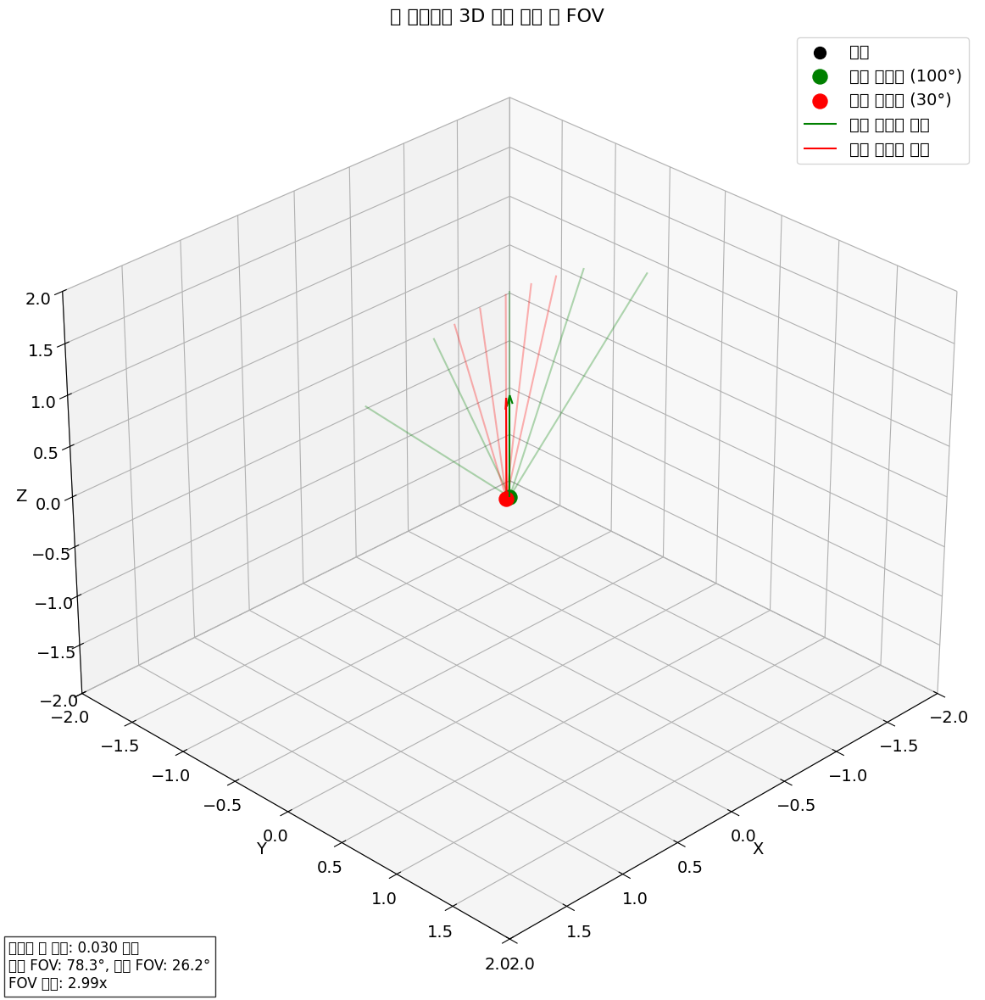

In [47]:
# 외부 파라미터를 활용한 FOV 시각화
# 결과 비교 및 시각화
print("=" * 50)
print("시각화 및 결과 비교")
print("=" * 50)

# 1. 광각 이미지에 내부 파라미터만 사용한 FOV 바운딩 박스와 
#    외부+내부 파라미터를 사용한 FOV 바운딩 박스 비교

# 위치 및 크기 계산 (픽셀 좌표)
int_x1 = int(bbox_x_center_alt * wide_width - bbox_width_alt * wide_width / 2)
int_y1 = int(bbox_y_center_alt * wide_height - bbox_height_alt * wide_height / 2)
int_x2 = int(bbox_x_center_alt * wide_width + bbox_width_alt * wide_width / 2)
int_y2 = int(bbox_y_center_alt * wide_height + bbox_height_alt * wide_height / 2)

ext_x1 = int(extrinsic_bbox_x_center * wide_width - extrinsic_bbox_width * wide_width / 2)
ext_y1 = int(extrinsic_bbox_y_center * wide_height - extrinsic_bbox_height * wide_height / 2)
ext_x2 = int(extrinsic_bbox_x_center * wide_width + extrinsic_bbox_width * wide_width / 2)
ext_y2 = int(extrinsic_bbox_y_center * wide_height + extrinsic_bbox_height * wide_height / 2)

# 개별 이미지 표시
plt.figure(figsize=(20, 10))

# 1. 광각 이미지에 내부 파라미터만 사용한 FOV 바운딩 박스
img1 = wide_img.copy()
cv2.rectangle(img1, (int_x1, int_y1), (int_x2, int_y2), (0, 255, 0), 3)

# 정보 텍스트 추가
label1 = f"내부 파라미터 기반: {int_x2-int_x1}x{int_y2-int_y1} px"
cv2.putText(img1, label1, (int_x1, int_y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

# YOLO 포맷 정보 추가
yolo_info1 = f"YOLO: [{bbox_width_alt:.4f}x{bbox_height_alt:.4f}]"
cv2.putText(img1, yolo_info1, (int_x1, int_y1-40), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

# 2. 광각 이미지에 외부+내부 파라미터를 사용한 FOV 바운딩 박스
img2 = wide_img.copy()
cv2.rectangle(img2, (ext_x1, ext_y1), (ext_x2, ext_y2), (0, 0, 255), 3)

# 정보 텍스트 추가
label2 = f"내부+외부 파라미터 기반: {ext_x2-ext_x1}x{ext_y2-ext_y1} px"
cv2.putText(img2, label2, (ext_x1, ext_y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 0, 255), 2)

# YOLO 포맷 정보 추가
yolo_info2 = f"YOLO: [{extrinsic_bbox_width:.4f}x{extrinsic_bbox_height:.4f}]"
cv2.putText(img2, yolo_info2, (ext_x1, ext_y1-40), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 0, 255), 2)

# 두 이미지 비교 표시
plt.subplot(1, 2, 1)
plt.imshow(img1)
plt.title("내부 파라미터만 사용한 FOV (Green)", fontsize=14)
plt.axis('on')

plt.subplot(1, 2, 2)
plt.imshow(img2)
plt.title("외부+내부 파라미터 사용한 FOV (Red)", fontsize=14)
plt.axis('on')

plt.tight_layout()
plt.show()

# 두 결과를 한 이미지에 함께 표시
plt.figure(figsize=(15, 12))
combined_img = wide_img.copy()

# 내부 파라미터만 사용한 FOV (녹색)
cv2.rectangle(combined_img, (int_x1, int_y1), (int_x2, int_y2), (0, 255, 0), 3)

# 외부+내부 파라미터 사용한 FOV (빨간색)
cv2.rectangle(combined_img, (ext_x1, ext_y1), (ext_x2, ext_y2), (0, 0, 255), 3)

# 범례 및 부가 정보 추가
legend_y_pos = 50
cv2.putText(combined_img, "내부 파라미터만 (Green)", (50, legend_y_pos), 
           cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
cv2.putText(combined_img, f"크기: {int_x2-int_x1}x{int_y2-int_y1} px, YOLO: [{bbox_width_alt:.4f}x{bbox_height_alt:.4f}]", 
           (50, legend_y_pos+40), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)

cv2.putText(combined_img, "내부+외부 파라미터 (Red)", (50, legend_y_pos+100), 
           cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)
cv2.putText(combined_img, f"크기: {ext_x2-ext_x1}x{ext_y2-ext_y1} px, YOLO: [{extrinsic_bbox_width:.4f}x{extrinsic_bbox_height:.4f}]", 
           (50, legend_y_pos+140), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 0, 255), 2)

# 두 방법의 차이 표시
diff_width = abs(extrinsic_bbox_width - bbox_width_alt)
diff_height = abs(extrinsic_bbox_height - bbox_height_alt)
diff_center_x = abs(extrinsic_bbox_x_center - bbox_x_center_alt)
diff_center_y = abs(extrinsic_bbox_y_center - bbox_y_center_alt)

diff_info = f"차이(크기): {diff_width:.4f}x{diff_height:.4f}, 차이(중심): {diff_center_x:.4f}x{diff_center_y:.4f}"
cv2.putText(combined_img, diff_info, (50, legend_y_pos+200), 
           cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)

plt.imshow(combined_img)
plt.title("FOV 비교: 내부 파라미터 vs 내부+외부 파라미터", fontsize=16)
plt.axis('on')
plt.tight_layout()
plt.show()

# 3D 시각화: 두 카메라의 상대적 위치와 방향 표현
plt.figure(figsize=(12, 12))
ax = plt.axes(projection='3d')

# 좌표계 원점
ax.scatter(0, 0, 0, color='k', s=100, label='원점')

# 두 카메라의 위치
cam_100_pos = np.array([0, 0, 0])  # 광각 카메라는 원점에 있다고 가정
cam_30_pos = T  # T는 협각 카메라에서 광각 카메라로의 평행이동

ax.scatter(cam_100_pos[0], cam_100_pos[1], cam_100_pos[2], color='g', s=150, label='광각 카메라 (100°)')
ax.scatter(cam_30_pos[0], cam_30_pos[1], cam_30_pos[2], color='r', s=150, label='협각 카메라 (30°)')

# 카메라 시선 방향 (z축)
length = 1.0  # 벡터 길이
cam_100_dir = np.array([0, 0, 1]) * length  # 기본 z축 방향
cam_30_dir = np.dot(R, np.array([0, 0, 1])) * length  # R 적용

ax.quiver(cam_100_pos[0], cam_100_pos[1], cam_100_pos[2], 
          cam_100_dir[0], cam_100_dir[1], cam_100_dir[2], 
          color='g', arrow_length_ratio=0.1, label='광각 카메라 방향')

ax.quiver(cam_30_pos[0], cam_30_pos[1], cam_30_pos[2], 
          cam_30_dir[0], cam_30_dir[1], cam_30_dir[2], 
          color='r', arrow_length_ratio=0.1, label='협각 카메라 방향')

# FOV를 시각화하기 위한 추가 코드
# 광각 카메라의 FOV 시각화 (간소화된 형태)
wide_fov_lines = []
# z축 시선 방향을 기준으로 약 100도 FOV 각도 계산
wide_angles = np.linspace(-wide_hfov_alt/2, wide_hfov_alt/2, 5)
for angle in wide_angles:
    # x-z 평면상의 회전
    x = np.sin(angle) * length * 2
    z = np.cos(angle) * length * 2
    wide_fov_lines.append([x, 0, z])  # y는 0으로 고정

wide_fov_lines = np.array(wide_fov_lines)
for i in range(len(wide_fov_lines)):
    ax.plot([cam_100_pos[0], cam_100_pos[0]+wide_fov_lines[i,0]], 
            [cam_100_pos[1], cam_100_pos[1]+wide_fov_lines[i,1]], 
            [cam_100_pos[2], cam_100_pos[2]+wide_fov_lines[i,2]], 'g-', alpha=0.3)

# 협각 카메라의 FOV 시각화
narrow_fov_lines = []
# z축 시선 방향을 기준으로 약 30도 FOV 각도 계산
narrow_angles = np.linspace(-narrow_hfov_alt/2, narrow_hfov_alt/2, 5)
for angle in narrow_angles:
    # 기준 좌표계에서의 방향 벡터
    x = np.sin(angle) * length * 2
    z = np.cos(angle) * length * 2
    # 회전 행렬 R을 적용하여 협각 카메라 좌표계로 변환
    dir_vec = np.dot(R, np.array([x, 0, z]))
    narrow_fov_lines.append(dir_vec)

narrow_fov_lines = np.array(narrow_fov_lines)
for i in range(len(narrow_fov_lines)):
    ax.plot([cam_30_pos[0], cam_30_pos[0]+narrow_fov_lines[i,0]], 
            [cam_30_pos[1], cam_30_pos[1]+narrow_fov_lines[i,1]], 
            [cam_30_pos[2], cam_30_pos[2]+narrow_fov_lines[i,2]], 'r-', alpha=0.3)

# 축 레이블과 제목
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('두 카메라의 3D 공간 관계 및 FOV', fontsize=16)

# 축 범위 설정
ax_range = max(2.0, np.max(np.abs(T)) * 1.5)  # T 값에 따라 적절한 범위 설정
ax.set_xlim(-ax_range, ax_range)
ax.set_ylim(-ax_range, ax_range)
ax.set_zlim(-ax_range, ax_range)

# 더 나은 시각화를 위한 뷰 각도 설정
ax.view_init(elev=30, azim=45)

# 카메라 간 관계 정보 텍스트 추가
info_str = f"카메라 간 거리: {np.linalg.norm(T):.3f} 단위\n"
info_str += f"광각 FOV: {wide_hfov_deg:.1f}°, 협각 FOV: {narrow_hfov_deg:.1f}°\n"
info_str += f"FOV 비율: {fov_ratio_h:.2f}x"

plt.figtext(0.02, 0.02, info_str, fontsize=12, bbox=dict(facecolor='white', alpha=0.8))

# 범례 표시
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()

# 외부 파라미터를 활용한 FOV 시각화와 실제 이미지 비교
print("=" * 50)
print("협각 카메라 FOV 시각화 및 이미지 비교")
print("=" * 50)

# 가장 정확한 FOV 계산 결과 사용 (외부+내부 파라미터 기반)
if len(projected_corners) > 0:
    fov_x_center = extrinsic_bbox_x_center
    fov_y_center = extrinsic_bbox_y_center
    fov_width = extrinsic_bbox_width
    fov_height = extrinsic_bbox_height
    fov_method = "외부+내부 파라미터 기반"
else:
    fov_x_center = bbox_x_center_alt
    fov_y_center = bbox_y_center_alt
    fov_width = bbox_width_alt
    fov_height = bbox_height_alt
    fov_method = "내부 파라미터 기반"

# 픽셀 좌표로 변환
bbox_x1 = max(0, int(fov_x_center * wide_width - fov_width * wide_width / 2))
bbox_y1 = max(0, int(fov_y_center * wide_height - fov_height * wide_height / 2))
bbox_x2 = min(wide_width, int(fov_x_center * wide_width + fov_width * wide_width / 2))
bbox_y2 = min(wide_height, int(fov_y_center * wide_height + fov_height * wide_height / 2))

# 1. 광각 이미지에 협각 카메라 FOV 영역 표시
bbox_img = wide_img.copy()

# 바운딩 박스 그리기 (빨간색, 굵게)
cv2.rectangle(bbox_img, (bbox_x1, bbox_y1), (bbox_x2, bbox_y2), (255, 0, 0), 3)

# 박스 정보 텍스트
bbox_info = f"협각 FOV: {bbox_x2-bbox_x1}x{bbox_y2-bbox_y1} px, {fov_method}"
cv2.putText(bbox_img, bbox_info, (bbox_x1, bbox_y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)

# 2. 협각 카메라 FOV에 해당하는 부분 크롭
try:
    fov_region = wide_img[bbox_y1:bbox_y2, bbox_x1:bbox_x2]
    if fov_region.size == 0:
        raise ValueError("크롭 영역의 크기가 0입니다.")
except Exception as e:
    print(f"FOV 영역 크롭 오류: {e}")
    fov_region = wide_img.copy()

# 3. 시각화: 광각 이미지, 추출된 FOV 영역, 협각 이미지 비교
plt.figure(figsize=(20, 10))

# 3.1 광각 이미지에 FOV 영역 표시
plt.subplot(1, 3, 1)
plt.imshow(bbox_img)
plt.title(f"광각 카메라 + 협각 FOV ({fov_method})", fontsize=14)
plt.axis('on')

# 3.2 크롭된 FOV 영역 (Wide 카메라에서 잘라낸 부분)
plt.subplot(1, 3, 2)
plt.imshow(fov_region)
plt.title(f"광각에서 추출한 FOV 영역: {bbox_x2-bbox_x1}x{bbox_y2-bbox_y1} px", fontsize=14)
plt.axis('on')

# 3.3 실제 협각 카메라 이미지
plt.subplot(1, 3, 3)
plt.imshow(narrow_img)
plt.title(f"실제 협각 카메라 이미지: {narrow_width}x{narrow_height} px", fontsize=14)
plt.axis('on')

plt.tight_layout()
plt.show()

# 4. 확대된 상세 비교 (FOV 영역과 협각 이미지 비교)
plt.figure(figsize=(20, 10))

# 4.1 크롭된 FOV 영역을 협각 이미지 크기로 리사이징
try:
    # FOV 영역이 존재하고 유효한 경우에만 리사이징
    if fov_region.shape[0] > 0 and fov_region.shape[1] > 0:
        # 협각 카메라와 동일한 크기로 리사이징
        fov_region_resized = cv2.resize(fov_region, (narrow_width, narrow_height))
    else:
        raise ValueError("FOV 영역이 유효하지 않습니다.")
except Exception as e:
    print(f"FOV 영역 리사이징 오류: {e}")
    fov_region_resized = np.zeros_like(narrow_img)
    cv2.putText(fov_region_resized, "리사이징 오류", (50, fov_region_resized.shape[0]//2), 
               cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255, 255, 255), 2)

# 4.2 Side-by-side로 크롭된 FOV와 협각 이미지 비교
plt.subplot(1, 2, 1)
plt.imshow(fov_region_resized)
plt.title("광각 카메라에서 크롭한 FOV 영역 (리사이즈됨)", fontsize=14)
plt.axis('on')

plt.subplot(1, 2, 2)
plt.imshow(narrow_img)
plt.title("실제 협각 카메라 이미지", fontsize=14)
plt.axis('on')

plt.tight_layout()
plt.show()

# 5. 차이 분석: FOV 영역과 협각 이미지 간의 픽셀 단위 차이 시각화
plt.figure(figsize=(20, 10))

# 5.1 두 이미지를 합성하여 차이 확인 (반투명 오버레이)
overlay_img = narrow_img.copy()
try:
    # 두 이미지의 알파 블렌딩을 위해 float32로 변환
    narrow_float = narrow_img.astype(np.float32) / 255.0
    fov_float = fov_region_resized.astype(np.float32) / 255.0
    
    # 50:50 비율로 혼합
    alpha = 0.5
    overlay_img = (narrow_float * alpha + fov_float * (1-alpha)) * 255.0
    overlay_img = overlay_img.astype(np.uint8)
    
    plt.subplot(1, 2, 1)
    plt.imshow(overlay_img)
    plt.title("협각 이미지 + FOV 영역 오버레이 (50% 투명도)", fontsize=14)
    plt.axis('on')
    
    # 두 이미지의 절대 차이 계산
    diff_img = cv2.absdiff(narrow_img, fov_region_resized)
    
    plt.subplot(1, 2, 2)
    plt.imshow(diff_img)
    plt.title("두 이미지 간 픽셀 차이", fontsize=14)
    plt.axis('on')
except Exception as e:
    print(f"이미지 합성 오류: {e}")
    plt.subplot(1, 2, 1)
    plt.imshow(narrow_img)
    plt.title("합성 오류 - 협각 이미지", fontsize=14)
    plt.axis('on')
    
    plt.subplot(1, 2, 2)
    plt.imshow(fov_region_resized)
    plt.title("합성 오류 - FOV 영역", fontsize=14)
    plt.axis('on')

plt.tight_layout()
plt.show()

# 6. 3D 시각화: 두 카메라의 상대적 위치와 방향 표현
plt.figure(figsize=(12, 12))
ax = plt.axes(projection='3d')

# 좌표계 원점
ax.scatter(0, 0, 0, color='k', s=100, label='원점')

# 두 카메라의 위치
cam_100_pos = np.array([0, 0, 0])  # 광각 카메라는 원점에 있다고 가정
cam_30_pos = T  # T는 협각 카메라에서 광각 카메라로의 평행이동

ax.scatter(cam_100_pos[0], cam_100_pos[1], cam_100_pos[2], color='g', s=150, label='광각 카메라 (100°)')
ax.scatter(cam_30_pos[0], cam_30_pos[1], cam_30_pos[2], color='r', s=150, label='협각 카메라 (30°)')

# 카메라 시선 방향 (z축)
length = 1.0  # 벡터 길이
cam_100_dir = np.array([0, 0, 1]) * length  # 기본 z축 방향
cam_30_dir = np.dot(R, np.array([0, 0, 1])) * length  # R 적용

ax.quiver(cam_100_pos[0], cam_100_pos[1], cam_100_pos[2], 
          cam_100_dir[0], cam_100_dir[1], cam_100_dir[2], 
          color='g', arrow_length_ratio=0.1, label='광각 카메라 방향')

ax.quiver(cam_30_pos[0], cam_30_pos[1], cam_30_pos[2], 
          cam_30_dir[0], cam_30_dir[1], cam_30_dir[2], 
          color='r', arrow_length_ratio=0.1, label='협각 카메라 방향')

# FOV를 시각화하기 위한 추가 코드
# 광각 카메라의 FOV 시각화 (간소화된 형태)
wide_fov_lines = []
# z축 시선 방향을 기준으로 약 100도 FOV 각도 계산
wide_angles = np.linspace(-wide_hfov_alt/2, wide_hfov_alt/2, 5)
for angle in wide_angles:
    # x-z 평면상의 회전
    x = np.sin(angle) * length * 2
    z = np.cos(angle) * length * 2
    wide_fov_lines.append([x, 0, z])  # y는 0으로 고정

wide_fov_lines = np.array(wide_fov_lines)
for i in range(len(wide_fov_lines)):
    ax.plot([cam_100_pos[0], cam_100_pos[0]+wide_fov_lines[i,0]], 
            [cam_100_pos[1], cam_100_pos[1]+wide_fov_lines[i,1]], 
            [cam_100_pos[2], cam_100_pos[2]+wide_fov_lines[i,2]], 'g-', alpha=0.3)

# 협각 카메라의 FOV 시각화
narrow_fov_lines = []
# z축 시선 방향을 기준으로 약 30도 FOV 각도 계산
narrow_angles = np.linspace(-narrow_hfov_alt/2, narrow_hfov_alt/2, 5)
for angle in narrow_angles:
    # 기준 좌표계에서의 방향 벡터
    x = np.sin(angle) * length * 2
    z = np.cos(angle) * length * 2
    # 회전 행렬 R을 적용하여 협각 카메라 좌표계로 변환
    dir_vec = np.dot(R, np.array([x, 0, z]))
    narrow_fov_lines.append(dir_vec)

narrow_fov_lines = np.array(narrow_fov_lines)
for i in range(len(narrow_fov_lines)):
    ax.plot([cam_30_pos[0], cam_30_pos[0]+narrow_fov_lines[i,0]], 
            [cam_30_pos[1], cam_30_pos[1]+narrow_fov_lines[i,1]], 
            [cam_30_pos[2], cam_30_pos[2]+narrow_fov_lines[i,2]], 'r-', alpha=0.3)

# 축 레이블과 제목
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('두 카메라의 3D 공간 관계 및 FOV', fontsize=16)

# 축 범위 설정
ax_range = max(2.0, np.max(np.abs(T)) * 1.5)  # T 값에 따라 적절한 범위 설정
ax.set_xlim(-ax_range, ax_range)
ax.set_ylim(-ax_range, ax_range)
ax.set_zlim(-ax_range, ax_range)

# 더 나은 시각화를 위한 뷰 각도 설정
ax.view_init(elev=30, azim=45)

# 카메라 간 관계 정보 텍스트 추가
info_str = f"카메라 간 거리: {np.linalg.norm(T):.3f} 단위\n"
info_str += f"광각 FOV: {wide_hfov_deg:.1f}°, 협각 FOV: {narrow_hfov_deg:.1f}°\n"
info_str += f"FOV 비율: {fov_ratio_h:.2f}x"

plt.figtext(0.02, 0.02, info_str, fontsize=12, bbox=dict(facecolor='white', alpha=0.8))

# 범례 표시
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()

In [48]:
# 결과 요약 및 YOLO 형식 라벨 생성
print("\n" + "="*50)
print("결과 요약 및 YOLO 형식 라벨 생성")
print("="*50)

# 두 계산법의 결과 비교 및 요약
print("1. 내부 파라미터만 사용한 결과:")
print(f"   - YOLO 포맷: center=({bbox_x_center_alt:.6f}, {bbox_y_center_alt:.6f}), size=({bbox_width_alt:.6f}, {bbox_height_alt:.6f})")
print(f"   - 픽셀 크기: {int(bbox_width_alt * wide_width)}x{int(bbox_height_alt * wide_height)}")

print("\n2. 내부+외부 파라미터 사용한 결과:")
print(f"   - YOLO 포맷: center=({extrinsic_bbox_x_center:.6f}, {extrinsic_bbox_y_center:.6f}), size=({extrinsic_bbox_width:.6f}, {extrinsic_bbox_height:.6f})")
print(f"   - 픽셀 크기: {int(extrinsic_bbox_width * wide_width)}x{int(extrinsic_bbox_height * wide_height)}")

print("\n3. 두 방법의 차이:")
print(f"   - 중심점 차이: ({abs(extrinsic_bbox_x_center - bbox_x_center_alt):.6f}, {abs(extrinsic_bbox_y_center - bbox_y_center_alt):.6f})")
print(f"   - 크기 차이: ({abs(extrinsic_bbox_width - bbox_width_alt):.6f}, {abs(extrinsic_bbox_height - bbox_height_alt):.6f})")

# 최종 권장 파라미터
print("\n최종 권장 YOLO 형식 바운딩 박스:")
# 외부 파라미터가 있는 경우 외부+내부 파라미터 결과 사용, 아니면 내부 파라미터만 사용
if len(projected_corners) > 0:
    final_x_center = extrinsic_bbox_x_center
    final_y_center = extrinsic_bbox_y_center
    final_width = extrinsic_bbox_width
    final_height = extrinsic_bbox_height
    print("(외부+내부 파라미터 기반)")
else:
    final_x_center = bbox_x_center_alt
    final_y_center = bbox_y_center_alt
    final_width = bbox_width_alt
    final_height = bbox_height_alt
    print("(내부 파라미터 기반)")

print(f"0 {final_x_center:.6f} {final_y_center:.6f} {final_width:.6f} {final_height:.6f}")

# YOLO 형식 라벨 생성 함수
def generate_yolo_narrow_fov_labels(output_dir="labels", filename_prefix="cam_100"):
    """
    광각 이미지에서 협각 카메라 FOV의 위치를 나타내는 YOLO 형식 라벨을 생성
    
    Args:
        output_dir: 라벨 파일을 저장할 디렉토리
        filename_prefix: 광각 이미지 파일 이름 접두사
        
    Returns:
        생성된 라벨 파일 경로
    """
    import os
    
    # 출력 디렉토리 생성
    os.makedirs(output_dir, exist_ok=True)
    
    # 라벨 파일 경로
    label_file = os.path.join(output_dir, f"{filename_prefix}_narrow_fov.txt")
    
    # YOLO 형식 라벨 데이터 생성
    # 클래스 0, 중심 x, 중심 y, 너비, 높이
    label_data = f"0 {final_x_center:.6f} {final_y_center:.6f} {final_width:.6f} {final_height:.6f}"
    
    # 파일에 라벨 데이터 저장
    with open(label_file, "w") as f:
        f.write(label_data)
    
    print(f"YOLO 형식 라벨이 생성되었습니다: {label_file}")
    return label_file

# 함수 사용 예시
# label_file = generate_yolo_narrow_fov_labels()

# 듀얼 스트림 YOLO 학습을 위한 가이드
print("\n" + "="*50)
print("듀얼 스트림 YOLO 학습을 위한 가이드")
print("="*50)
print("1. 광각 카메라 이미지에서 협각 카메라의 FOV를 나타내는 YOLO 형식 라벨을 생성하려면:")
print("   generate_yolo_narrow_fov_labels() 함수를 실행하세요.")
print("\n2. 생성된 라벨 파일을 사용하여 듀얼 스트림 YOLO 학습에 활용할 수 있습니다.")
print("   - 광각 이미지: 전체 장면을 볼 수 있는 넓은 시야")
print("   - 협각 이미지: 관심 영역을 고해상도로 보는 좁은 시야")
print("\n3. 이 라벨을 사용하면 협각 이미지의 FOV가 광각 이미지의 어느 위치에 있는지 파악하는데 도움이 됩니다.")
print("   - 이 정보는 두 이미지 스트림을 통합하는 데 활용될 수 있습니다.")
print("   - 광각에서 감지된 객체가 협각 FOV 내에 있는지 확인할 수 있습니다.")

# 저장된 파라미터 표시
print("\n" + "="*50)
print("파라미터 요약")
print("="*50)
print("내부 파라미터:")
print(f"광각 카메라: fx={wide_fx:.2f}, fy={wide_fy:.2f}, cx={wide_cx:.2f}, cy={wide_cy:.2f}")
print(f"협각 카메라: fx={narrow_fx:.2f}, fy={narrow_fy:.2f}, cx={narrow_cx:.2f}, cy={narrow_cy:.2f}")
print("\n외부 파라미터:")
print(f"회전 행렬:\n{R}")
print(f"평행이동 벡터: [{T[0]:.5f}, {T[1]:.5f}, {T[2]:.5f}]")

print("\n시야각 (FOV):")
print(f"광각 카메라: 수평 {wide_hfov_deg:.2f}°, 수직 {wide_vfov_deg:.2f}°")
print(f"협각 카메라: 수평 {narrow_hfov_deg:.2f}°, 수직 {narrow_vfov_deg:.2f}°")
print(f"FOV 비율: 수평 {fov_ratio_h:.4f}x, 수직 {fov_ratio_v:.4f}x")

# 설정 저장 함수
def save_camera_parameters(file_path="dual_camera_params.yaml"):
    """
    계산된 카메라 파라미터를 YAML 파일로 저장
    
    Args:
        file_path: 저장할 YAML 파일 경로
        
    Returns:
        저장된 파일 경로
    """
    import yaml
    from datetime import datetime
    
    # 저장할 파라미터 데이터 구성
    params = {
        "wide_camera": {
            "intrinsics": {
                "fx": float(wide_fx),
                "fy": float(wide_fy),
                "cx": float(wide_cx),
                "cy": float(wide_cy),
                "width": int(wide_width),
                "height": int(wide_height)
            },
            "fov": {
                "horizontal_deg": float(wide_hfov_deg),
                "vertical_deg": float(wide_vfov_deg)
            }
        },
        "narrow_camera": {
            "intrinsics": {
                "fx": float(narrow_fx),
                "fy": float(narrow_fy),
                "cx": float(narrow_cx),
                "cy": float(narrow_cy),
                "width": int(narrow_width),
                "height": int(narrow_height)
            },
            "fov": {
                "horizontal_deg": float(narrow_hfov_deg),
                "vertical_deg": float(narrow_vfov_deg)
            }
        },
        "extrinsics": {
            "rotation_matrix": R.tolist(),
            "translation_vector": T.tolist()
        },
        "narrow_fov_in_wide": {
            "yolo_format": {
                "center_x": float(final_x_center),
                "center_y": float(final_y_center),
                "width": float(final_width),
                "height": float(final_height)
            },
            "pixel_format": {
                "x1": int(final_x_center * wide_width - final_width * wide_width / 2),
                "y1": int(final_y_center * wide_height - final_height * wide_height / 2),
                "x2": int(final_x_center * wide_width + final_width * wide_width / 2),
                "y2": int(final_y_center * wide_height + final_height * wide_height / 2),
            }
        },
        "metadata": {
            "calculation_method": "extrinsic+intrinsic" if len(projected_corners) > 0 else "intrinsic_only",
            "date_generated": datetime.now().strftime("%Y-%m-%d %H:%M:%S")
        }
    }
    
    # YAML 파일로 저장
    try:
        with open(file_path, 'w') as f:
            yaml.dump(params, f, default_flow_style=False)
        print(f"카메라 파라미터가 저장되었습니다: {file_path}")
        return file_path
    except Exception as e:
        print(f"파라미터 저장 오류: {e}")
        return None

# 함수 사용 예시
# params_file = save_camera_parameters()


결과 요약 및 YOLO 형식 라벨 생성
1. 내부 파라미터만 사용한 결과:
   - YOLO 포맷: center=(0.500000, 0.500000), size=(0.334485, 0.308170)
   - 픽셀 크기: 642x332

2. 내부+외부 파라미터 사용한 결과:
   - YOLO 포맷: center=(0.499289, 0.499912), size=(0.286041, 0.291975)
   - 픽셀 크기: 549x315

3. 두 방법의 차이:
   - 중심점 차이: (0.000711, 0.000088)
   - 크기 차이: (0.048444, 0.016194)

최종 권장 YOLO 형식 바운딩 박스:
(외부+내부 파라미터 기반)
0 0.499289 0.499912 0.286041 0.291975

듀얼 스트림 YOLO 학습을 위한 가이드
1. 광각 카메라 이미지에서 협각 카메라의 FOV를 나타내는 YOLO 형식 라벨을 생성하려면:
   generate_yolo_narrow_fov_labels() 함수를 실행하세요.

2. 생성된 라벨 파일을 사용하여 듀얼 스트림 YOLO 학습에 활용할 수 있습니다.
   - 광각 이미지: 전체 장면을 볼 수 있는 넓은 시야
   - 협각 이미지: 관심 영역을 고해상도로 보는 좁은 시야

3. 이 라벨을 사용하면 협각 이미지의 FOV가 광각 이미지의 어느 위치에 있는지 파악하는데 도움이 됩니다.
   - 이 정보는 두 이미지 스트림을 통합하는 데 활용될 수 있습니다.
   - 광각에서 감지된 객체가 협각 FOV 내에 있는지 확인할 수 있습니다.

파라미터 요약
내부 파라미터:
광각 카메라: fx=1178.66, fy=1200.90, cx=936.44, cy=545.82
협각 카메라: fx=4125.61, fy=4123.22, cx=929.45, cy=592.44

외부 파라미터:
회전 행렬:
[[ 1.00002182e+00  8.53084599e-05  1.05237653e-02]
 [-9.70005850e-05 

In [49]:
# # Ultralytics YOLOv8 듀얼 스트림 설정 통합
# print("\n" + "="*50)
# print("Ultralytics YOLOv8 듀얼 스트림 설정 통합")
# print("="*50)

# # cam_params_loader.py 파일 생성 함수
# def create_cam_params_loader(output_path="cam_params_loader.py"):
#     """
#     카메라 파라미터를 로드하는 Python 모듈을 생성합니다.
#     이 모듈은 Ultralytics YOLOv8 듀얼 스트림 학습에 활용할 수 있습니다.
    
#     Args:
#         output_path: 생성할 Python 파일 경로
        
#     Returns:
#         생성된 파일 경로
#     """
#     code = f"""# Dual Camera Parameters Loader
# # Generated by camera_fov_analysis_v2.ipynb

# import numpy as np
# import yaml
# import os
# from pathlib import Path

# def load_dual_camera_params(param_file=None):
#     \"\"\"
#     듀얼 카메라 파라미터를 로드합니다.
#     파일이 지정되지 않으면 기본 파라미터를 반환합니다.
    
#     Args:
#         param_file: YAML 파라미터 파일 경로 (선택적)
        
#     Returns:
#         params: 카메라 파라미터 딕셔너리
#     \"\"\"
#     # 기본 파라미터 (분석 결과 기반)
#     default_params = {{
#         "wide_camera": {{
#             "intrinsics": {{
#                 "fx": {wide_fx},
#                 "fy": {wide_fy},
#                 "cx": {wide_cx},
#                 "cy": {wide_cy},
#                 "width": {wide_width},
#                 "height": {wide_height}
#             }},
#             "fov": {{
#                 "horizontal_deg": {wide_hfov_deg},
#                 "vertical_deg": {wide_vfov_deg}
#             }}
#         }},
#         "narrow_camera": {{
#             "intrinsics": {{
#                 "fx": {narrow_fx},
#                 "fy": {narrow_fy},
#                 "cx": {narrow_cx},
#                 "cy": {narrow_cy},
#                 "width": {narrow_width},
#                 "height": {narrow_height}
#             }},
#             "fov": {{
#                 "horizontal_deg": {narrow_hfov_deg},
#                 "vertical_deg": {narrow_vfov_deg}
#             }}
#         }},
#         "narrow_fov_in_wide": {{
#             "yolo_format": {{
#                 "center_x": {final_x_center},
#                 "center_y": {final_y_center},
#                 "width": {final_width},
#                 "height": {final_height}
#             }},
#             "pixel_format": {{
#                 "x1": {int(final_x_center * wide_width - final_width * wide_width / 2)},
#                 "y1": {int(final_y_center * wide_height - final_height * wide_height / 2)},
#                 "x2": {int(final_x_center * wide_width + final_width * wide_width / 2)},
#                 "y2": {int(final_y_center * wide_height + final_height * wide_height / 2)}
#             }}
#         }}
#     }}
    
#     # 파일이 제공되면 해당 파일에서 로드
#     if param_file and os.path.exists(param_file):
#         try:
#             with open(param_file, 'r') as f:
#                 loaded_params = yaml.safe_load(f)
#             return loaded_params
#         except Exception as e:
#             print(f"파라미터 파일 로드 오류: {{e}}")
#             print("기본 파라미터를 사용합니다.")
    
#     return default_params

# def get_narrow_fov_in_wide(params=None):
#     \"\"\"
#     광각 이미지에서 협각 카메라 FOV의 위치를 YOLO 형식으로 반환합니다.
    
#     Args:
#         params: 카메라 파라미터 딕셔너리 (선택적)
        
#     Returns:
#         center_x, center_y, width, height: YOLO 형식 좌표
#     \"\"\"
#     if params is None:
#         params = load_dual_camera_params()
    
#     yolo_format = params["narrow_fov_in_wide"]["yolo_format"]
#     return (
#         yolo_format["center_x"],
#         yolo_format["center_y"],
#         yolo_format["width"],
#         yolo_format["height"]
#     )

# def apply_narrow_fov_crop(wide_image, params=None):
#     \"\"\"
#     광각 이미지에서 협각 카메라 FOV 영역을 크롭합니다.
    
#     Args:
#         wide_image: 광각 이미지 (numpy array)
#         params: 카메라 파라미터 딕셔너리 (선택적)
        
#     Returns:
#         cropped_image: 크롭된 이미지
#     \"\"\"
#     import cv2
    
#     if params is None:
#         params = load_dual_camera_params()
    
#     # 픽셀 좌표 가져오기
#     pixel_format = params["narrow_fov_in_wide"]["pixel_format"]
#     x1, y1 = pixel_format["x1"], pixel_format["y1"]
#     x2, y2 = pixel_format["x2"], pixel_format["y2"]
    
#     # 이미지 경계 확인 및 조정
#     h, w = wide_image.shape[:2]
#     x1 = max(0, x1)
#     y1 = max(0, y1)
#     x2 = min(w, x2)
#     y2 = min(h, y2)
    
#     # 이미지 크롭
#     return wide_image[y1:y2, x1:x2]

# if __name__ == "__main__":
#     # 모듈 테스트
#     params = load_dual_camera_params()
#     print("카메라 파라미터 로드 완료")
#     print("광각 카메라 FOV:", params["wide_camera"]["fov"]["horizontal_deg"], "degrees")
#     print("협각 카메라 FOV:", params["narrow_camera"]["fov"]["horizontal_deg"], "degrees")
    
#     center_x, center_y, width, height = get_narrow_fov_in_wide(params)
#     print("\\n협각 FOV의 YOLO 형식 좌표:")
#     print(f"중심: ({{center_x:.6f}}, {{center_y:.6f}})")
#     print(f"크기: {{width:.6f}}x{{height:.6f}}")
#     print(f"YOLO 라벨 형식: 0 {{center_x:.6f}} {{center_y:.6f}} {{width:.6f}} {{height:.6f}}")
# """
    
#     # 파일에 코드 저장
#     try:
#         with open(output_path, "w") as f:
#             f.write(code)
#         print(f"카메라 파라미터 로더 모듈이 생성되었습니다: {output_path}")
#         return output_path
#     except Exception as e:
#         print(f"파일 생성 오류: {e}")
#         return None

# # 사용 예시 코드 생성 함수
# def create_example_usage_code(output_path="cam_params_example.py"):
#     """
#     카메라 파라미터 로더를 사용하는 예시 코드를 생성합니다.
    
#     Args:
#         output_path: 생성할 Python 파일 경로
        
#     Returns:
#         생성된 파일 경로
#     """
#     code = """# Dual Camera Parameters Example Usage
# # Example code for using the camera parameter loader

# import cv2
# import numpy as np
# import matplotlib.pyplot as plt
# from cam_params_loader import load_dual_camera_params, get_narrow_fov_in_wide, apply_narrow_fov_crop

# def main():
#     # 카메라 파라미터 로드
#     params = load_dual_camera_params()
    
#     # 샘플 이미지 로드 (여기서는 더미 이미지 생성)
#     print("샘플 이미지를 생성합니다...")
#     wide_img = np.zeros((params["wide_camera"]["intrinsics"]["height"], 
#                          params["wide_camera"]["intrinsics"]["width"], 3), dtype=np.uint8)
#     wide_img[:, :, 0] = 30  # 파란색 계열
    
#     # 테스트용 패턴 추가
#     for i in range(0, wide_img.shape[0], 50):
#         cv2.line(wide_img, (0, i), (wide_img.shape[1], i), (255, 255, 255), 1)
#     for i in range(0, wide_img.shape[1], 50):
#         cv2.line(wide_img, (i, 0), (i, wide_img.shape[0]), (255, 255, 255), 1)
    
#     # 중앙에 타겟 추가
#     cv2.circle(wide_img, (wide_img.shape[1]//2, wide_img.shape[0]//2), 100, (0, 255, 0), 3)
#     cv2.putText(wide_img, "Target", (wide_img.shape[1]//2 - 50, wide_img.shape[0]//2 - 120), 
#                cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
    
#     # 협각 FOV 바운딩 박스 그리기
#     center_x, center_y, width, height = get_narrow_fov_in_wide(params)
#     pixel_x1 = int((center_x - width/2) * wide_img.shape[1])
#     pixel_y1 = int((center_y - height/2) * wide_img.shape[0])
#     pixel_x2 = int((center_x + width/2) * wide_img.shape[1])
#     pixel_y2 = int((center_y + height/2) * wide_img.shape[0])
    
#     # 바운딩 박스 그리기
#     img_with_bbox = wide_img.copy()
#     cv2.rectangle(img_with_bbox, (pixel_x1, pixel_y1), (pixel_x2, pixel_y2), (0, 0, 255), 3)
#     cv2.putText(img_with_bbox, "Narrow FOV", (pixel_x1, pixel_y1-10), 
#                cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)
    
#     # 협각 FOV 영역 크롭
#     cropped_img = apply_narrow_fov_crop(wide_img, params)
    
#     # 결과 시각화
#     plt.figure(figsize=(18, 6))
    
#     plt.subplot(1, 3, 1)
#     plt.imshow(wide_img)
#     plt.title("Original Wide Image")
#     plt.axis('on')
    
#     plt.subplot(1, 3, 2)
#     plt.imshow(img_with_bbox)
#     plt.title("Wide Image with Narrow FOV Bounding Box")
#     plt.axis('on')
    
#     plt.subplot(1, 3, 3)
#     plt.imshow(cropped_img)
#     plt.title("Cropped Narrow FOV Region")
#     plt.axis('on')
    
#     plt.tight_layout()
#     plt.show()
    
#     print("\\n카메라 파라미터 정보:")
#     print(f"광각 FOV: {params['wide_camera']['fov']['horizontal_deg']:.2f}°")
#     print(f"협각 FOV: {params['narrow_camera']['fov']['horizontal_deg']:.2f}°")
#     print(f"FOV 비율: {params['wide_camera']['fov']['horizontal_deg'] / params['narrow_camera']['fov']['horizontal_deg']:.2f}x")
    
#     print("\\nYOLO 형식 바운딩 박스:")
#     print(f"0 {center_x:.6f} {center_y:.6f} {width:.6f} {height:.6f}")

# if __name__ == "__main__":
#     main()
# """
    
#     # 파일에 코드 저장
#     try:
#         with open(output_path, "w") as f:
#             f.write(code)
#         print(f"예시 사용 코드가 생성되었습니다: {output_path}")
#         return output_path
#     except Exception as e:
#         print(f"파일 생성 오류: {e}")
#         return None

# # 유틸리티 모듈 생성
# print("\n카메라 파라미터 유틸리티 모듈 생성:")
# loader_path = create_cam_params_loader()
# example_path = create_example_usage_code()

# # 실행 방법 안내
# if loader_path and example_path:
#     print("\n생성된 파일 사용 방법:")
#     print(f"1. {loader_path}: 카메라 파라미터 로더 모듈")
#     print(f"2. {example_path}: 사용 예시 코드")
#     print("\n예시 코드 실행 방법:")
#     print(f"   python {example_path}")
#     print("\nUltralytics YOLOv8 듀얼 스트림 학습에 통합하는 방법:")
#     print("1. 학습 데이터셋에 YOLO 형식 라벨 파일을 추가합니다.")
#     print(f"   - 클래스 0, 중심 ({final_x_center:.6f}, {final_y_center:.6f}), 크기 ({final_width:.6f}, {final_height:.6f})")
#     print("2. 학습 과정에서 cam_params_loader.py를 임포트하여 필요한 파라미터를 로드합니다.")
#     print("3. 듀얼 스트림 모델에서 두 카메라 간의 관계를 학습하는 데 이 정보를 활용합니다.")
#     print("\n상세 사용 방법은 코드 주석을 참고하세요.")
# else:
#     print("\n파일 생성 중 오류가 발생했습니다.")